# imports, functions, settings

In [1]:
import pandas as pd
import anndata
import numpy as np
import scipy 

import scanpy as sc
import leidenalg

# do gene set overlap to the groups in the gene list and top 100 DEGs.

import gseapy
from gseapy.plot import barplot, dotplot

#plotting plotly
import plotly.express as px
import plotly.graph_objects as go
import plotly.io as pio
pio.templates.default = 'simple_white'

import re
from ipywidgets import widgets
from ipywidgets import interact

import dash_bio
from pyvis.network import Network

import itertools

import networkx as nx
from pyvis.network import Network

# functions and imports

from scipy.stats import gaussian_kde
from numpy import mean
from numpy import std
from scipy.stats import mannwhitneyu
from scipy.stats import ttest_ind
from scipy.stats import f_oneway
from scipy import stats
import scikit_posthocs as sp
import statistics


In [2]:
#### some functions that help in plotting

def calc_curve(data):
    """Calculate probability density."""
    min_, max_ = data.min(), data.max()
    X = [min_ + i * ((max_ - min_) / 500) for i in range(501)]
    Y = gaussian_kde(data).evaluate(X)
    return(X, Y)

from plotly.offline import plot


#### functions

#function for plotly

def import_adata(adata, use_raw=True, make_var_unique=True):
    """
    Function for extracting data from adata objects
    required for plotting by genespector
    Consider using backed adata to save memory?
    """

    if make_var_unique:
        adata.var_names_make_unique()

    # Extracting categorical/string data
    catcols = [str(x) in ["category"] for x in adata.obs.dtypes]
    catinfo = adata.obs.loc[:, catcols]

    # Extracting coordinate data (all the obsm fields)
    coords = pd.DataFrame(index=adata.obs.index)
    for i in list(adata.obsm.keys())[::-1]:
        colnames = [i + "_" + str(x) for x in range(1, adata.obsm[i].shape[1] + 1)]
        coordsI = pd.DataFrame(adata.obsm[i], columns=colnames, index=adata.obs.index)
        coords = pd.concat((coords, coordsI), axis=1)

    # Extracting gene expression data
    if use_raw:
        genexpr = adata.raw.X
    else:
        genexpr = adata.X

    # Using scipy sparse matrix (csr) type for efficiency. If the array is not sparse,
    # it is converted
    if type(genexpr) != scipy.sparse.csr.csr_matrix:
        genexpr = scipy.sparse.csr_matrix(genexpr)
    if use_raw:
        genekeys = (
            adata.raw.var.index.values
        )  # Names of the columns in the gene expression array
    else:
        genekeys = adata.var.index.values

    # Extracting numerical data from the .obs slot
    numcols = [
        str(x) in ["float64", "float32", "in32", "int64"] for x in adata.obs.dtypes
    ]
    nummeta = adata.obs.loc[:, numcols]
    numkeys = nummeta.columns.values

    numinfo = np.empty((adata.obs.shape[0], 0))
    for i in nummeta:
        numI = adata.obs[i].astype("float64")
        numI = numI.values.reshape((numI.shape[0], 1))
        numinfo = np.concatenate((numinfo, numI), axis=1)

    # extracting colour data
    color_catinfo = {}
    for i in adata.uns.keys():
        i = str(i)
        check = re.sub("(.*)(_)(.*)", "\\3", i)
        if check == "colors":
            category = re.sub("(.*)(_)(.*)", "\\1", i)
            color_catinfo[category] = {
                x: adata.uns[i][n]
                for n, x in enumerate(adata.obs[category].cat.categories)
            }

    return {
        "catinfo": catinfo,
        "color_catinfo": color_catinfo,
        "numkeys": numkeys,
        "numinfo": numinfo,
        "genexpr": genexpr,
        "genekeys": genekeys,
        "coords": coords,
    }



#### plotly plotting

def update_figure_scatter(
        splitbyvalue,
        colorvalue,
        Xaxis,
        Yaxis,
        pointsize,
        axiswitchvalue,
        cmin_input,
        cmax_input,
        opacity,
    ):
        """App callback
        Specifies inputs and outputs from sliders and dropdown menus
        and generates graph objects, which are updated respectively
        """

        if colorvalue == "categorical data":
            pass
        elif colorvalue in graphdata["numkeys"]:
            colors = np.squeeze(
                np.array(graphdata["numinfo"][:, graphdata["numkeys"] == colorvalue])
            )
        else:
            colors = np.squeeze(
                np.array(
                    graphdata["genexpr"][
                        :, graphdata["genekeys"] == colorvalue
                    ].todense()
                )
            )

        traces = []

        category = graphdata["catinfo"][splitbyvalue].cat.categories

        for i in category:

            boolSUB = graphdata["catinfo"][splitbyvalue] == i

            if colorvalue == "categorical data":

                graph = go.Scattergl(
                    x=graphdata["coords"].loc[boolSUB, :][Xaxis].values,
                    y=graphdata["coords"].loc[boolSUB, :][Yaxis].values,
                    mode="markers",
                    marker=dict(opacity=opacity / 100, size=pointsize),
                    name=str(i),
                )

                # Checking if there is matchig color code for the category
                if splitbyvalue in graphdata["color_catinfo"].keys():
                    marker_color = graphdata["color_catinfo"][splitbyvalue][i]
                    graph["marker"]["color"] = marker_color

                traces.append(graph)

            else:
                colorSUB = colors[boolSUB]
                catinfoSUB = graphdata["catinfo"].loc[boolSUB, :]

                # Option for diverging colorscale
                if any(colors < 0) and any(colors > 0):
                    # colorscale = 'RdBu'
                    colorscale = [
                        [0, "rgba(31, 58, 147, 1)"],
                        [-min(colors) / (max(colors) - min(colors)), "#DCDCDC"],
                        [1, "rgba(207, 0, 15, 1)"],
                    ]
                else:
                    colorscale = "Viridis"  #'Blackbody'

                # Specifying the markers
                cmin = min(colors)
                cmax = max(colors)
                if cmin_input != "":
                    cmin = float(cmin_input)
                if cmax_input != "":
                    cmax = float(cmax_input)
                marker = dict(
                    color=colorSUB,
                    cmin=cmin,
                    cmax=cmax,
                    opacity=opacity / 100,
                    colorscale=colorscale,
                    size=pointsize,
                )

                traces.append(
                    go.Scattergl(
                        x=graphdata["coords"].loc[boolSUB, :][Xaxis].values,
                        y=graphdata["coords"].loc[boolSUB, :][Yaxis].values,
                        mode="markers",
                        marker=marker,
                        name=str(i),
                        text=[
                            catinfoSUB.index.values[x]
                            + "<br>"
                            + splitbyvalue
                            + " "
                            + catinfoSUB[splitbyvalue].values[x]
                            + "<br>"
                            + str(colorSUB[x])
                            for x in range(0, len(catinfoSUB.index))
                        ],
                        hoverinfo="text",
                    )
                )

        if not colorvalue == "categorical data":
            traces[-1]["marker"]["colorbar"] = dict(
                thickness=14, x=1.15, title=colorvalue
            )
        if axiswitchvalue == "ON":
            axiscolor = "#BBBBBB"
        else:
            axiscolor = "#ffffff"

        return {
            "data": traces,
            "layout": {
                "xaxis": {"title": Xaxis, "color": axiscolor},
                "yaxis": {"title": Yaxis, "color": axiscolor},
                "height": 800,
                "width": 800,
                "hovermode": "closest",
                "uirevision": "{}{}".format(Xaxis, Yaxis),
            },
        }

In [3]:
#### scanpy global settings

sc.settings.verbosity = 3             # verbosity: errors (0), warnings (1), info (2), hints (3)
sc.logging.print_header()

results_file = 'scrna_ri_results.h5ad'



scanpy==1.9.2 anndata==0.8.0 umap==0.5.3 numpy==1.23.5 scipy==1.10.1 pandas==1.5.3 scikit-learn==1.2.1 statsmodels==0.13.5 python-igraph==0.10.4 pynndescent==0.5.8


# importing scrnaseq data, creating reusable objects

In [4]:
# loading data
data = pd.read_csv('Combined_SCABDJUR1309_RSEC_MolsPerCell.csv')
data.index = data['Cell_Index']
data.drop('Cell_Index', axis=1, inplace=True)
data

,ADA,ADGRE1,ADGRG3,AIM2,ALAS2,ANXA5,AOC3,APOBEC3G,APOE,AQP9,...,VNN2,VPREB3,VPS28,VSIG4,XBP1,YBX3,ZAP70,ZBED2,ZBTB16,ZNF683
Cell_Index,,,,,,,,,,,,,,,,,,,,,
151750,2,0,0,0,1,10,0,3,0,1,...,1,0,1,0,110,2,0,0,0,2
10932909,0,0,0,0,0,10,0,1,0,0,...,2,1,1,0,188,1,0,0,0,0
1946537,5,0,0,0,0,10,0,10,0,1,...,0,0,5,0,31,0,0,0,0,0
2827402,2,0,0,0,0,10,0,22,0,0,...,0,0,3,0,33,2,0,0,0,0
1505324,3,1,0,0,1,9,0,1,0,1,...,1,0,1,0,152,1,1,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
12702370,1,0,0,0,43,0,0,0,0,0,...,0,0,0,0,0,3,0,0,0,0
7683161,0,0,0,0,35,0,0,0,0,0,...,0,0,0,0,0,1,0,0,0,0
6793435,0,0,0,0,30,0,0,0,0,0,...,0,0,0,0,0,4,0,0,0,0


In [5]:
# loading metadata
metadata = pd.read_csv('SCABDJUR1309_Sample_Tag_Calls.csv')
metadata

,Cell_Index,Sample_Tag,Sample_Name
0,151750,SampleTag11_hs,Tissue3
1,10932909,SampleTag11_hs,Tissue3
2,1946537,Multiplet,Multiplet
3,2827402,SampleTag08_hs,PBMC3
4,1505324,SampleTag11_hs,Tissue3
...,...,...,...
14880,12702370,SampleTag08_hs,PBMC3
14881,7683161,SampleTag08_hs,PBMC3
14882,6793435,SampleTag08_hs,PBMC3
14883,8999436,SampleTag08_hs,PBMC3


In [6]:
# creating anndata object from data and metadata

adata = sc.AnnData(data)
adata.obs = metadata
adata


/tmp/ipykernel_11564/3921423034.py:3: FutureWarning:

X.dtype being converted to np.float32 from int64. In the next version of anndata (0.9) conversion will not be automatic. Pass dtype explicitly to avoid this warning. Pass `AnnData(X, dtype=X.dtype, ...)` to get the future behavour.

/home/mrinalmanu/miniconda3/envs/scrna/lib/python3.8/site-packages/anndata/_core/anndata.py:121: ImplicitModificationWarning:

Transforming to str index.



AnnData object with n_obs × n_vars = 14885 × 397
    obs: 'Cell_Index', 'Sample_Tag', 'Sample_Name'

In [7]:
# overall stats
adata.obs['Sample_Tag'].value_counts()

SampleTag08_hs    6962
SampleTag06_hs    2408
Multiplet         2253
SampleTag07_hs    1667
SampleTag11_hs     976
SampleTag10_hs     566
SampleTag09_hs      45
Undetermined         8
Name: Sample_Tag, dtype: int64

In [8]:
adata.obs['Sample_Name'].value_counts()

PBMC3           6962
PBMC1           2408
Multiplet       2253
PBMC2           1667
Tissue3          976
Tissue2          566
Tissue1           45
Undetermined       8
Name: Sample_Name, dtype: int64

In [9]:
adata = adata[adata.obs['Sample_Name'].isin(['Tissue3',
 'PBMC3',
 'Tissue2',
 'PBMC2',
 'PBMC1',
                                            'Tissue1'])]

In [10]:
adata.obs['Sample_Name'].value_counts()

PBMC3      6962
PBMC1      2408
PBMC2      1667
Tissue3     976
Tissue2     566
Tissue1      45
Name: Sample_Name, dtype: int64

In [11]:
# for coloring purposes

## grouping into pbmcs and tissues
adata.obs['Sample_Groups'] = adata.obs['Sample_Name'].str.replace('\d+', '')
adata.obs['Sample_Groups'] = adata.obs['Sample_Name'].str.replace('\d+', '')

/tmp/ipykernel_11564/126423301.py:4: FutureWarning:

The default value of regex will change from True to False in a future version.

/tmp/ipykernel_11564/126423301.py:4: ImplicitModificationWarning:

Trying to modify attribute `.obs` of view, initializing view as actual.

/home/mrinalmanu/miniconda3/envs/scrna/lib/python3.8/site-packages/anndata/_core/anndata.py:121: ImplicitModificationWarning:

Transforming to str index.

/tmp/ipykernel_11564/126423301.py:5: FutureWarning:

The default value of regex will change from True to False in a future version.



In [12]:
# some normalisations etc

adata.obs['n_counts'] = adata.X.sum(1)
adata.obs['log_counts'] = np.log(adata.obs['n_counts'])
adata.obs['n_genes'] = (adata.X > 0).sum(1)

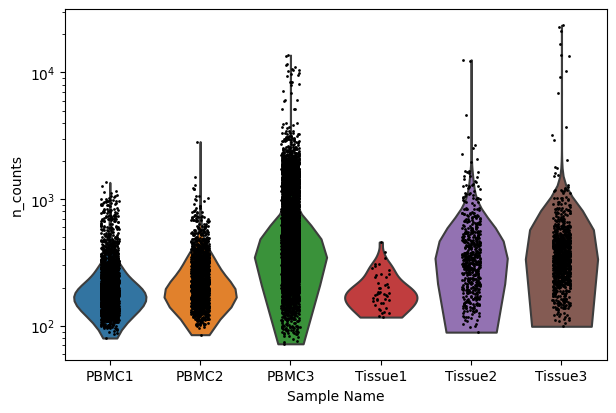

In [13]:
#Sample quality plots
sc.pl.violin(adata, 'n_counts', groupby='Sample_Name', size=2, log=True, cut=0)

In [14]:
# sample plot, but plotly

fig = px.violin(adata.obs, x='Sample_Name' , 
                y="n_counts",
               color='Sample_Groups',
               box=True)

fig.show()

In [15]:
# removing tissue 1
adata = adata[adata.obs['Sample_Name'].isin(['Tissue3',
 'PBMC3',
 'Tissue2',
 'PBMC2',
 'PBMC1'])]

In [16]:
# sample plot, but plotly

fig = px.violin(adata.obs, x='Sample_Name' , 
                y="n_counts",
               color='Sample_Groups',
               box=True)

fig.show()

In [17]:
#Keeping a raw copy of the data in a seperate layer
adata.layers["counts"] = adata.X.copy()

In [18]:
#Normalize adata 
adata.X = sc.pp.log1p(adata.X)
sc.pp.log1p(adata)
# Store the full data set in 'raw' as log-normalised data for statistical testing
adata.raw = adata

In [19]:
# higly variable genes
sc.pp.highly_variable_genes(adata, min_mean=0.0125, max_mean=3, min_disp=0.5)

extracting highly variable genes
    finished (0:00:00)
--> added
    'highly_variable', boolean vector (adata.var)
    'means', float vector (adata.var)
    'dispersions', float vector (adata.var)
    'dispersions_norm', float vector (adata.var)


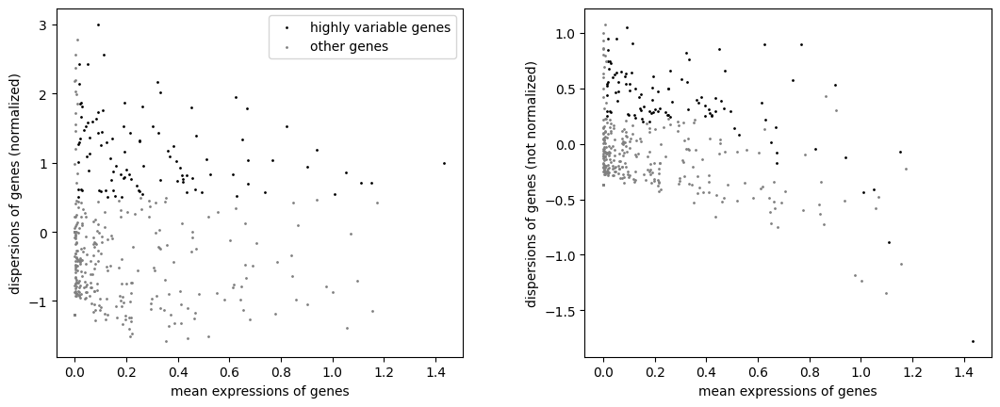

In [20]:
sc.pl.highly_variable_genes(adata)

In [21]:
adata.var

,highly_variable,means,dispersions,dispersions_norm
ADA,False,0.220614,-0.171927,-0.730759
ADGRE1,False,0.071259,0.004763,-0.169128
ADGRG3,False,0.005752,0.065024,-0.003108
AIM2,False,0.006043,-0.218606,-0.784510
ALAS2,True,0.089512,1.049643,3.002345
...,...,...,...,...
YBX3,False,0.291181,0.169180,0.365186
ZAP70,False,0.125592,-0.322499,-1.199872
ZBED2,False,0.003806,0.053341,-0.035296
ZBTB16,False,0.059718,-0.199939,-0.733080


In [22]:
# same plot but plotly

datax = adata.var.reset_index()

fig = px.scatter(datax, x="means", y="dispersions", hover_data = ['index'], color='highly_variable')
fig.show()

In [23]:
# Calculate the visualizations
sc.pp.pca(adata, n_comps=50, use_highly_variable=True, svd_solver='arpack')
sc.pp.neighbors(adata)

computing PCA
    on highly variable genes
    with n_comps=50
    finished (0:00:00)
computing neighbors
    using 'X_pca' with n_pcs = 50
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:23)


In [24]:
# umap
sc.tl.umap(adata)

computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:15)


In [28]:
# lovain clustering at 1 resolution
sc.tl.louvain(adata, resolution=1.0, key_added='louvain_r1', random_state=10)

running Louvain clustering
    using the "louvain" package of Traag (2017)
    finished: found 15 clusters and added
    'louvain_r1', the cluster labels (adata.obs, categorical) (0:00:01)


In [29]:
# lovain clustering at 0.5 resolution
sc.tl.louvain(adata, resolution=0.5, key_added='louvain_r0.5', random_state=10)

running Louvain clustering
    using the "louvain" package of Traag (2017)
    finished: found 10 clusters and added
    'louvain_r0.5', the cluster labels (adata.obs, categorical) (0:00:02)


/home/mrinalmanu/miniconda3/envs/scrna/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning:

No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored

/home/mrinalmanu/miniconda3/envs/scrna/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning:

No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored



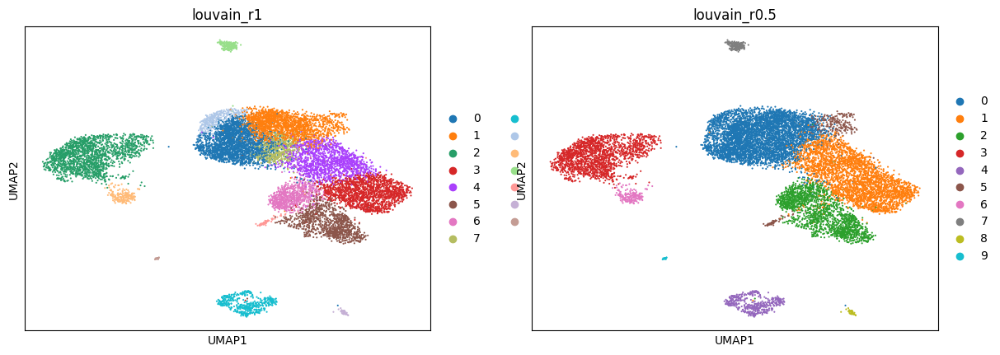

In [30]:
#Visualize the clustering and how this is reflected by different technical covariates
sc.pl.umap(adata, color=['louvain_r1', 'louvain_r0.5'])

ranking genes
    finished: added to `.uns['wilcoxon']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:00:00)


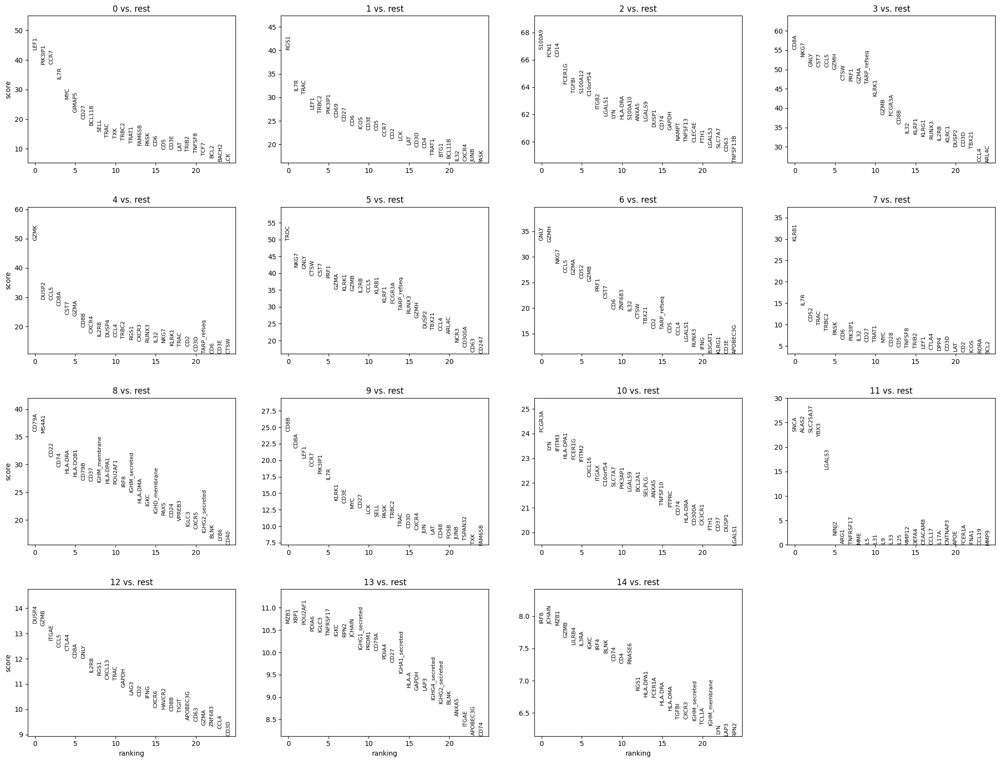

    using 'X_pca' with n_pcs = 50
Storing dendrogram info using `.uns['dendrogram_louvain_r1']`


In [31]:
# rank gene groups

sc.tl.rank_genes_groups(adata, groupby='louvain_r1', method='wilcoxon', key_added = "wilcoxon")
sc.pl.rank_genes_groups(adata, n_genes=25, sharey=False,  key = "wilcoxon")
# dendrogram computed seperately
sc.tl.dendrogram(adata, groupby="louvain_r1")

# manual annotations

In [32]:
# taking highly variable genes from each cluster
result = adata.uns['wilcoxon']
groups = result['names'].dtype.names
xdf = pd.DataFrame(
    {group + '_' + key[:1]: result[key][group]
    for group in groups for key in ['names', 'scores']}).head(5)
xdf

,0_n,0_s,1_n,1_s,2_n,2_s,3_n,3_s,4_n,4_s,...,10_n,10_s,11_n,11_s,12_n,12_s,13_n,13_s,14_n,14_s
0,LEF1,43.470226,RGS1,40.155006,S100A9,66.747200,CD8A,55.116840,GZMK,49.279835,...,FCGR3A,24.069979,SNCA,23.108433,DUSP4,13.413675,MZB1,10.659800,IRF8,7.894375
1,PIK3IP1,38.548225,IL7R,31.456701,FCN1,66.259285,NKG7,53.384033,DUSP2,29.291836,...,LYN,23.348509,ALAS2,22.989397,GZMB,13.290821,XBP1,10.659039,JCHAIN,7.873777
2,CCR7,38.476849,TRAC,30.723791,CD14,66.197159,GNLY,50.657669,CCL5,29.083935,...,IFITM3,23.299417,SLC25A37,22.935875,ITGAE,12.729123,POU2AF1,10.636199,MZB1,7.861387
3,IL7R,33.659546,LEF1,27.458162,FCER1G,64.257889,CST7,50.587349,CD8A,27.047718,...,HLA-DPA1,22.990498,YBX3,22.165884,CCL5,12.453292,PDIA6,10.483145,GZMB,7.665143
4,MYC,26.769871,TRBC2,26.721615,TGFBI,63.574219,CCL5,50.531967,CST7,24.051247,...,FCER1G,22.981886,LGALS3,15.445819,CTLA4,12.303300,IGLC3,10.463079,LILRB4,7.558901


In [33]:
define_head=20 # define the number of genes to take

In [34]:
# creating a dataframe for clustergram
markdf = pd.DataFrame(
    {group: result[key][group]
    for group in groups for key in ['names']}).head(define_head)
valuedf = pd.DataFrame(
      {group: result[key][group]
    for group in groups for key in ['scores']}).head(define_head)
markdf = markdf.melt()
valuedf = valuedf.melt()

merge_df = pd.merge(markdf, valuedf, left_index=True, right_index=True)
merge_df.drop('variable_y', axis=1, inplace=True)
merge_df.columns = ['Cluster','Gene','Score']
merge_df


,Cluster,Gene,Score
0,0,LEF1,43.470226
1,0,PIK3IP1,38.548225
2,0,CCR7,38.476849
3,0,IL7R,33.659546
4,0,MYC,26.769871
...,...,...,...
295,14,HLA-DRA,6.626996
296,14,HLA-DMA,6.538256
297,14,TGFBI,6.404439
298,14,CXCR3,6.401131


In [35]:
df = merge_df.pivot(index='Cluster', columns='Gene', values='Score')
df = df.fillna(0)
df.head(2)

Gene,ALAS2,ANXA5,APOBEC3G,ARG1,BCL11B,BCL2A1,BLNK,BTG1,C10orf54,CCL17,...,TRAC,TRAT1,TRBC2,TRDC,TRIB2,TXK,VPREB3,XBP1,YBX3,ZNF683
Cluster,,,,,,,,,,,,,,,,,,,,,
0,0.0,0.0,0.0,0.0,18.017626,0.0,0.0,0.000000,0.0,0.0,...,13.819348,11.818236,12.911165,0.0,9.065166,13.562119,0.0,0.0,0.0,0.0
1,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,17.444214,0.0,0.0,...,30.723791,17.606771,26.721615,0.0,0.000000,0.000000,0.0,0.0,0.0,0.0


In [36]:
fig = dash_bio.Clustergram(
    data=df.iloc[:, : len(merge_df.Gene.unique())],
    column_labels=list(df.columns.values),
    row_labels=list(df.index),
    height=720,
    width=2800
)
fig.write_html('dendro.html')
fig.show()

In [37]:
# highly variable genes plot but using plotly


fig = px.bar(merge_df,  x='Gene',y='Score',
                    color='Cluster', hover_data=['Gene'], barmode= 'stack')



fig.show()

In [38]:
clusters = list(merge_df.Cluster.unique())

merge_df['Cluster'] = merge_df['Cluster'].map(int)

gene_lists = []

for cluster in clusters:
    sublist = merge_df[merge_df['Cluster'] == int(cluster)]
    gene_lists.append(list(sublist.Gene.str.strip().str.lower().str.capitalize()))



In [39]:
def flatten(l):
    return [item for sublist in l for item in sublist]

In [40]:
unique_genes = []

for i in clusters:
    sublist = gene_lists.copy()
    s = set(sublist[int(i)])
    popped_t = sublist[:int(i)] + sublist[int(i)+1:]
    t = set(flatten(popped_t))
    unique_genes.append(list(s.difference(t)))   # s - t        new set with elements in s but not in t
    print('For cluster {} unique genes are:'.format(i))
    print(unique_genes[int(i)])

For cluster 0 unique genes are:
['Fam65b', 'Gimap5', 'Txk', 'Bcl11b']
For cluster 1 unique genes are:
['Btg1', 'Cd69', 'Icos']
For cluster 2 unique genes are:
['Dusp1', 'Fcn1', 'Nampt', 'Clec4e', 'S100a12', 'S100a10', 'S100a9', 'Itgb2', 'Cd14', 'Tnfsf13']
For cluster 3 unique genes are:
['Klrg1', 'Klrc1']
For cluster 4 unique genes are:
['Gzmk']
For cluster 5 unique genes are:
['Trdc']
For cluster 6 unique genes are:
['Znf683']
For cluster 7 unique genes are:
['Tnfsf8', 'Dpp4', 'Cd28']
For cluster 8 unique genes are:
['Cd37', 'Cd22', 'Ighd_membrane', 'Ighm_membrane', 'Ms4a1', 'Cd24', 'Vpreb3', 'Hla-dqb1', 'Cd79b', 'Pax5']
For cluster 9 unique genes are:
['Cd48', 'Jun']
For cluster 10 unique genes are:
['Bcl2a1', 'Slc7a7', 'Ifitm2', 'Ptprc', 'Itgax', 'Cd300a', 'Tnfsf10', 'Pik3ap1', 'Cxcl16', 'Selplg', 'Ifitm3']
For cluster 11 unique genes are:
['Lgals3', 'Ceacam8', 'Cntnap3', 'Mmp12', 'Defa4', 'Il33', 'Arg1', 'Il17a', 'Il9', 'Il5', 'Snca', 'Il25', 'Slc25a37', 'Ninj2', 'Ccl17', 'Ybx3', '

In [41]:
# taking highly variable genes from each cluster
result = adata.uns['wilcoxon']
groups = result['names'].dtype.names
xdf = pd.DataFrame(
    {group + '_' + key[:1]: result[key][group]
    for group in groups for key in ['names', 'scores']}).head(5)

define_head=30 # define the number of genes to take

# creating a dataframe for clustergram
markdf = pd.DataFrame(
    {group: result[key][group]
    for group in groups for key in ['names']}).head(define_head)
valuedf = pd.DataFrame(
      {group: result[key][group]
    for group in groups for key in ['scores']}).head(define_head)
markdf = markdf.melt()
valuedf = valuedf.melt()

merge_df = pd.merge(markdf, valuedf, left_index=True, right_index=True)
merge_df.drop('variable_y', axis=1, inplace=True)
merge_df.columns = ['Cluster','Gene','Score']
merge_df


clusters = list(merge_df.Cluster.unique())
itx = []
for cluster in clusters:
    sublist = merge_df[merge_df['Cluster'] == cluster]
    items = list(sublist.Gene.str.strip().str.lower().str.capitalize())
    itx.append(items)
    print('DGE for cluster number {}'.format(cluster))
    print(items)


DGE for cluster number 0
['Lef1', 'Pik3ip1', 'Ccr7', 'Il7r', 'Myc', 'Gimap5', 'Cd27', 'Bcl11b', 'Sell', 'Trac', 'Txk', 'Trbc2', 'Trat1', 'Fam65b', 'Pask', 'Cd6', 'Cd5', 'Cd3e', 'Lat', 'Trib2', 'Tnfsf8', 'Tcf7', 'Bcl2', 'Bach2', 'Lck', 'Cd28', 'Dpp4', 'Fyb', 'Icos', 'Cd3d']
DGE for cluster number 1
['Rgs1', 'Il7r', 'Trac', 'Lef1', 'Trbc2', 'Pik3ip1', 'Cd69', 'Cd27', 'Cd6', 'Icos', 'Cd3e', 'Cd5', 'Ccr7', 'Cd2', 'Lck', 'Lat', 'Cd3d', 'Cd4', 'Trat1', 'Btg1', 'Bcl11b', 'Il32', 'Cxcr4', 'Junb', 'Pask', 'Fyb', 'Cd52', 'Myc', 'Trib2', 'Cd28']
DGE for cluster number 2
['S100a9', 'Fcn1', 'Cd14', 'Fcer1g', 'Tgfbi', 'S100a12', 'C10orf54', 'Itgb2', 'Lgals1', 'Lyn', 'Hla-dra', 'S100a10', 'Anxa5', 'Lgals9', 'Dusp1', 'Cd74', 'Gapdh', 'Nampt', 'Tnfsf13', 'Clec4e', 'Fth1', 'Lgals3', 'Slc7a7', 'Cd63', 'Tnfsf13b', 'Tlr2', 'Cd33', 'Lap3', 'Cd36', 'Ifitm3']
DGE for cluster number 3
['Cd8a', 'Nkg7', 'Gnly', 'Cst7', 'Ccl5', 'Gzmh', 'Ctsw', 'Prf1', 'Gzma', 'Tarp_refseq', 'Klrk1', 'Gzmb', 'Fcgr3a', 'Cd8b', 'Il3

### annotation charts from panglaodb based on unique and dge

NOTE: Throughout inverse of ubiquitousness is now taken!

In [42]:
markdf = pd.read_csv('/home/mrinalmanu/Documents/scrna_ri/panglao_markers.tsv', sep='\t')
markdf

,species,official gene symbol,cell type,nicknames,ubiquitousness index,product description,gene type,canonical marker,germ layer,organ,sensitivity_human,sensitivity_mouse,specificity_human,specificity_mouse
0,Mm Hs,CTRB1,Acinar cells,CTRB,0.018,chymotrypsinogen B1,protein-coding gene,1.0,Endoderm,Pancreas,1.000000,1.000000,0.000649,0.017624
1,Mm Hs,KLK1,Acinar cells,Klk6,0.014,kallikrein 1,protein-coding gene,1.0,Endoderm,Pancreas,0.833333,0.313433,0.005193,0.013771
2,Mm Hs,RBPJL,Acinar cells,RBP-L|SUHL|RBPSUHL,0.001,recombination signal binding protein for immun...,protein-coding gene,1.0,Endoderm,Pancreas,0.000000,0.194030,0.000000,0.000428
3,Mm Hs,PTF1A,Acinar cells,PTF1-p48|bHLHa29,0.001,pancreas associated transcription factor 1a,protein-coding gene,1.0,Endoderm,Pancreas,0.000000,0.164179,0.000649,0.000428
4,Mm,TRY4,Acinar cells,NaN,0.008,trypsin 4,protein coding gene,1.0,Endoderm,Pancreas,0.000000,0.686567,0.000000,0.006564
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8165,Mm Hs,MYH11,Vascular smooth muscle cells,SMMHC|SMHC,0.016,myosin heavy chain 11,protein-coding gene,NaN,Mesoderm,Smooth muscle,NaN,1.000000,0.016812,0.015979
8166,Mm Hs,PDGFRB,Vascular smooth muscle cells,JTK12|CD140b|PDGFR1|PDGFR,0.032,platelet derived growth factor receptor beta,protein-coding gene,NaN,Mesoderm,Smooth muscle,NaN,1.000000,0.037504,0.030964
8167,Mm Hs,SEMA3D,Vascular smooth muscle cells,coll-2|Sema-Z2,0.005,semaphorin 3D,protein-coding gene,NaN,Mesoderm,Smooth muscle,NaN,0.000000,0.001293,0.006321
8168,Mm Hs,TBX18,Vascular smooth muscle cells,NaN,0.004,T-box 18,protein-coding gene,NaN,Mesoderm,Smooth muscle,NaN,0.000000,0.000323,0.004900


In [43]:
blooddf = markdf.copy()
blooddf['symbol_new'] = blooddf['official gene symbol'].astype(np.str).str.lower().str.capitalize()

blooddf = blooddf[blooddf['symbol_new'].isin(list(adata.var_names.astype(np.str).str.lower().str.capitalize()))]
blooddf = blooddf[blooddf['organ'].isin(['Blood', 'Immune system'])]
#blooddf = blooddf[blooddf['species'].isin(['Hs'])]
blooddf

/tmp/ipykernel_11564/3686702964.py:2: DeprecationWarning:

`np.str` is a deprecated alias for the builtin `str`. To silence this warning, use `str` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.str_` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations

/tmp/ipykernel_11564/3686702964.py:4: DeprecationWarning:

`np.str` is a deprecated alias for the builtin `str`. To silence this warning, use `str` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.str_` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations



,species,official gene symbol,cell type,nicknames,ubiquitousness index,product description,gene type,canonical marker,germ layer,organ,sensitivity_human,sensitivity_mouse,specificity_human,specificity_mouse,symbol_new
415,Mm Hs,CD2,B cells,NaN,0.034,CD2 molecule,protein-coding gene,NaN,Mesoderm,Immune system,0.000000,0.234375,0.082590,0.021382,Cd2
416,Mm Hs,CD5,B cells,NaN,0.004,CD5 molecule,protein-coding gene,1.0,Mesoderm,Immune system,0.000000,0.000000,0.003304,0.004680,Cd5
417,Mm Hs,MS4A1,B cells,Bp35|MS4A2|CD20,0.013,membrane spanning 4-domains A1,protein-coding gene,1.0,Mesoderm,Immune system,0.515152,0.619792,0.009580,0.001728,Ms4a1
418,Mm Hs,CR2,B cells,CD21|C3DR,0.001,complement C3d receptor 2,protein-coding gene,1.0,Mesoderm,Immune system,0.045455,0.046875,0.000000,0.000000,Cr2
419,Mm Hs,CD22,B cells,SIGLEC-2|SIGLEC2,0.003,CD22 molecule,protein-coding gene,1.0,Mesoderm,Immune system,0.106061,0.171875,0.000991,0.000216,Cd22
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7900,Mm Hs,TNFRSF4,T regulatory cells,ACT35|OX40|CD134|TXGP1L,0.005,TNF receptor superfamily member 4,protein-coding gene,NaN,Mesoderm,Immune system,NaN,NaN,0.012932,0.002841,Tnfrsf4
7901,Mm Hs,CTLA4,T regulatory cells,CD152|CELIAC3|IDDM12,0.002,cytotoxic T-lymphocyte associated protein 4,protein-coding gene,1.0,Mesoderm,Immune system,NaN,NaN,0.002910,0.002201,Ctla4
7902,Mm Hs,CCR4,T regulatory cells,CC-CKR-4|CMKBR4|CKR4|k5-5|ChemR13|CD194,0.000,C-C motif chemokine receptor 4,protein-coding gene,NaN,Mesoderm,Immune system,NaN,NaN,0.000647,0.000000,Ccr4
7903,Mm Hs,LAG3,T regulatory cells,CD223,0.009,lymphocyte activating 3,protein-coding gene,NaN,Mesoderm,Immune system,NaN,NaN,0.010023,0.009303,Lag3


In [44]:
ddf = pd.DataFrame([clusters, itx, unique_genes]).T
ddf.columns = ['Cluster', 'DGE', 'Unique genes']
dugdf = pd.DataFrame([clusters, unique_genes]).T
dugdf.columns = ['Cluster','Unique genes']
dgedf = pd.DataFrame([clusters, itx]).T
dgedf.columns = ['Cluster','DGE']
ddf

,Cluster,DGE,Unique genes
0,0,"[Lef1, Pik3ip1, Ccr7, Il7r, Myc, Gimap5, Cd27,...","[Fam65b, Gimap5, Txk, Bcl11b]"
1,1,"[Rgs1, Il7r, Trac, Lef1, Trbc2, Pik3ip1, Cd69,...","[Btg1, Cd69, Icos]"
2,2,"[S100a9, Fcn1, Cd14, Fcer1g, Tgfbi, S100a12, C...","[Dusp1, Fcn1, Nampt, Clec4e, S100a12, S100a10,..."
3,3,"[Cd8a, Nkg7, Gnly, Cst7, Ccl5, Gzmh, Ctsw, Prf...","[Klrg1, Klrc1]"
4,4,"[Gzmk, Dusp2, Ccl5, Cd8a, Cst7, Gzma, Cd8b, Cx...",[Gzmk]
5,5,"[Trdc, Nkg7, Gnly, Ctsw, Cst7, Prf1, Gzma, Klr...",[Trdc]
6,6,"[Gnly, Gzmh, Nkg7, Ccl5, Gzma, Cd52, Gzmb, Prf...",[Znf683]
7,7,"[Klrb1, Il7r, Cd52, Trac, Trbc2, Pask, Cd6, Pi...","[Tnfsf8, Dpp4, Cd28]"
8,8,"[Cd79a, Ms4a1, Cd22, Cd74, Hla-dra, Hla-dqb1, ...","[Cd37, Cd22, Ighd_membrane, Ighm_membrane, Ms4..."
9,9,"[Cd8b, Cd8a, Lef1, Ccr7, Pik3ip1, Il7r, Klrk1,...","[Cd48, Jun]"


In [45]:
dgedf['DGE'] = dgedf['DGE'].apply(str)
dgedf['DGE'] = dgedf['DGE'].str.replace('[','')
dgedf['DGE'] = dgedf['DGE'].str.replace(']','')
dgedf['DGE'] = dgedf['DGE'].str.replace("'",'')
dgedf

/tmp/ipykernel_11564/1095836041.py:2: FutureWarning:

The default value of regex will change from True to False in a future version. In addition, single character regular expressions will *not* be treated as literal strings when regex=True.

/tmp/ipykernel_11564/1095836041.py:3: FutureWarning:

The default value of regex will change from True to False in a future version. In addition, single character regular expressions will *not* be treated as literal strings when regex=True.



,Cluster,DGE
0,0,"Lef1, Pik3ip1, Ccr7, Il7r, Myc, Gimap5, Cd27, ..."
1,1,"Rgs1, Il7r, Trac, Lef1, Trbc2, Pik3ip1, Cd69, ..."
2,2,"S100a9, Fcn1, Cd14, Fcer1g, Tgfbi, S100a12, C1..."
3,3,"Cd8a, Nkg7, Gnly, Cst7, Ccl5, Gzmh, Ctsw, Prf1..."
4,4,"Gzmk, Dusp2, Ccl5, Cd8a, Cst7, Gzma, Cd8b, Cxc..."
5,5,"Trdc, Nkg7, Gnly, Ctsw, Cst7, Prf1, Gzma, Klrk..."
6,6,"Gnly, Gzmh, Nkg7, Ccl5, Gzma, Cd52, Gzmb, Prf1..."
7,7,"Klrb1, Il7r, Cd52, Trac, Trbc2, Pask, Cd6, Pik..."
8,8,"Cd79a, Ms4a1, Cd22, Cd74, Hla-dra, Hla-dqb1, C..."
9,9,"Cd8b, Cd8a, Lef1, Ccr7, Pik3ip1, Il7r, Klrk1, ..."


In [46]:
dugdf['Unique genes'] = dugdf['Unique genes'].apply(str)
dugdf['Unique genes'] = dugdf['Unique genes'].str.replace('[','')
dugdf['Unique genes'] = dugdf['Unique genes'].str.replace(']','')
dugdf['Unique genes'] = dugdf['Unique genes'].str.replace("'",'')
dugdf

/tmp/ipykernel_11564/164246651.py:2: FutureWarning:

The default value of regex will change from True to False in a future version. In addition, single character regular expressions will *not* be treated as literal strings when regex=True.

/tmp/ipykernel_11564/164246651.py:3: FutureWarning:

The default value of regex will change from True to False in a future version. In addition, single character regular expressions will *not* be treated as literal strings when regex=True.



,Cluster,Unique genes
0,0,"Fam65b, Gimap5, Txk, Bcl11b"
1,1,"Btg1, Cd69, Icos"
2,2,"Dusp1, Fcn1, Nampt, Clec4e, S100a12, S100a10, ..."
3,3,"Klrg1, Klrc1"
4,4,Gzmk
5,5,Trdc
6,6,Znf683
7,7,"Tnfsf8, Dpp4, Cd28"
8,8,"Cd37, Cd22, Ighd_membrane, Ighm_membrane, Ms4a..."
9,9,"Cd48, Jun"


In [47]:


dugdf = (dugdf.drop('Unique genes', axis=1)
             .join
             (
             dugdf['Unique genes']
             .str
             .split(',', expand=True)
             .stack()
             .reset_index(drop=True, level=1)
             .rename('UG')           
             ))

dgedf = (dgedf.drop('DGE', axis=1)
             .join
             (
             dgedf['DGE']
             .str
             .split(',', expand=True)
             .stack()
             .reset_index(drop=True, level=1)
             .rename('DGE')           
             ))




In [48]:
xblooddf = pd.merge(blooddf, dugdf, left_on='symbol_new', right_on='UG')
xblooddf

,species,official gene symbol,cell type,nicknames,ubiquitousness index,product description,gene type,canonical marker,germ layer,organ,sensitivity_human,sensitivity_mouse,specificity_human,specificity_mouse,symbol_new,Cluster,UG
0,Mm Hs,CD37,B cells memory,TSPAN26,0.105,CD37 molecule,protein-coding gene,1.0,Mesoderm,Immune system,NaN,NaN,0.213708,0.079960,Cd37,8,Cd37
1,Mm Hs,CD37,B cells naive,TSPAN26,0.105,CD37 molecule,protein-coding gene,1.0,Mesoderm,Immune system,1.000000,NaN,0.209877,0.079960,Cd37,8,Cd37
2,Mm Hs,CD37,Plasma cells,TSPAN26,0.105,CD37 molecule,protein-coding gene,1.0,Mesoderm,Immune system,0.117647,NaN,0.214776,0.079960,Cd37,8,Cd37
3,Mm Hs,TNFSF8,B cells naive,CD153|CD30LG,0.001,TNF superfamily member 8,protein-coding gene,1.0,Mesoderm,Immune system,0.000000,NaN,0.000000,0.001278,Tnfsf8,7,Tnfsf8
4,Mm Hs,LGALS3,Dendritic cells,MAC-2|GALIG|LGALS2,0.156,galectin 3,protein-coding gene,1.0,Mesoderm,Immune system,0.557143,0.920000,0.294954,0.114320,Lgals3,11,Lgals3
5,Mm Hs,LGALS3,Macrophages,MAC-2|GALIG|LGALS2,0.156,galectin 3,protein-coding gene,1.0,Mesoderm,Immune system,0.444444,0.671463,0.306420,0.098793,Lgals3,11,Lgals3
6,Mm Hs,RNASE6,Dendritic cells,RNaseK6|RNS6,0.022,ribonuclease A family member k6,protein-coding gene,1.0,Mesoderm,Immune system,0.471429,0.520000,0.017271,0.017216,Rnase6,14,Rnase6
7,Mm Hs,TRDC,Gamma delta T cells,NaN,0.011,T cell receptor delta constant,other,1.0,Mesoderm,Immune system,0.657895,0.142857,0.010275,0.007460,Trdc,5,Trdc
8,Mm Hs,TRDC,NK cells,NaN,0.011,T cell receptor delta constant,other,NaN,Mesoderm,Immune system,0.377049,0.017857,0.019129,0.007486,Trdc,5,Trdc
9,Mm Hs,TRDC,T cells,NaN,0.011,T cell receptor delta constant,other,1.0,Mesoderm,Immune system,0.016461,0.373684,0.027017,0.002519,Trdc,5,Trdc


In [49]:
gblooddf = pd.merge(blooddf, dgedf, left_on='symbol_new', right_on='DGE')
gblooddf

,species,official gene symbol,cell type,nicknames,ubiquitousness index,product description,gene type,canonical marker,germ layer,organ,sensitivity_human,sensitivity_mouse,specificity_human,specificity_mouse,symbol_new,Cluster,DGE
0,Mm Hs,CD79A,B cells,MB-1|IGA,0.022,CD79a molecule,protein-coding gene,1.0,Mesoderm,Immune system,0.984848,0.895833,0.021804,0.003384,Cd79a,8,Cd79a
1,Mm Hs,CD79A,B cells memory,MB-1|IGA,0.022,CD79a molecule,protein-coding gene,1.0,Mesoderm,Immune system,NaN,NaN,0.042354,0.015552,Cd79a,8,Cd79a
2,Mm Hs,CD79A,B cells naive,MB-1|IGA,0.022,CD79a molecule,protein-coding gene,1.0,Mesoderm,Immune system,0.933333,NaN,0.038012,0.015552,Cd79a,8,Cd79a
3,Mm Hs,CD79A,Plasma cells,MB-1|IGA,0.022,CD79a molecule,protein-coding gene,1.0,Mesoderm,Immune system,0.794118,NaN,0.033998,0.015552,Cd79a,8,Cd79a
4,Mm Hs,MZB1,B cells,MGC29506|HSPC190|pERp1|MEDA-7,0.023,marginal zone B and B1 cell specific protein,protein-coding gene,NaN,Mesoderm,Immune system,0.530303,0.848958,0.027420,0.007415,Mzb1,13,Mzb1
5,Mm Hs,MZB1,Plasma cells,MGC29506|HSPC190|pERp1|MEDA-7,0.023,marginal zone B and B1 cell specific protein,protein-coding gene,1.0,Mesoderm,Immune system,1.000000,NaN,0.027460,0.018889,Mzb1,13,Mzb1
6,Mm Hs,MZB1,Plasmacytoid dendritic cells,MGC29506|HSPC190|pERp1|MEDA-7,0.023,marginal zone B and B1 cell specific protein,protein-coding gene,1.0,Mesoderm,Immune system,0.952381,0.692308,0.031901,0.018267,Mzb1,13,Mzb1
7,Mm Hs,IRF8,B cells memory,IRF-8|ICSBP|ICSBP1,0.060,interferon regulatory factor 8,protein-coding gene,1.0,Mesoderm,Immune system,NaN,NaN,0.026512,0.064550,Irf8,14,Irf8
8,Mm Hs,IRF8,B cells naive,IRF-8|ICSBP|ICSBP1,0.060,interferon regulatory factor 8,protein-coding gene,1.0,Mesoderm,Immune system,0.200000,NaN,0.025666,0.064550,Irf8,14,Irf8
9,Mm Hs,IRF8,Dendritic cells,IRF-8|ICSBP|ICSBP1,0.060,interferon regulatory factor 8,protein-coding gene,1.0,Mesoderm,Immune system,0.171429,0.760000,0.019641,0.063314,Irf8,14,Irf8


In [50]:
blooddf['lui'] = 1/blooddf["ubiquitousness index"]
fig = px.scatter(blooddf, y='cell type', x=blooddf['official gene symbol'].sort_values(ascending=True), color="ubiquitousness index", size="lui")
fig.update_layout(yaxis={"dtick":1},margin={"t":0,"b":0},height=500)
fig.update_layout(xaxis={"dtick":1},margin={"t":0,"b":0},width=3000)
fig.show()

In [51]:
#BASED ON DGE
gblooddf['lui'] = 1/gblooddf["ubiquitousness index"]
fig = px.scatter(gblooddf, y='cell type', x=gblooddf['official gene symbol'].sort_values(ascending=True), color="Cluster", size="lui")
fig.update_layout(yaxis={"dtick":1},margin={"t":0,"b":0},height=500)
fig.update_layout(xaxis={"dtick":1},margin={"t":0,"b":0},width=900)
fig.show()

In [52]:
#BASED ON Unique genes
xblooddf['lui'] = 1/xblooddf["ubiquitousness index"]
fig = px.scatter(xblooddf, y='cell type', x=xblooddf['official gene symbol'].sort_values(ascending=True), color="Cluster", size="lui")
fig.update_layout(yaxis={"dtick":1},margin={"t":0,"b":0},height=500)
fig.update_layout(xaxis={"dtick":1},margin={"t":0,"b":0},width=500)
fig.show()

In [53]:
import ast

In [54]:
cdf = xblooddf.groupby(['UG', 'cell type'])['Cluster'].agg(lambda x: """','""".join(x[x != ''])).reset_index()
nx = ("""'"""+cdf['Cluster'].astype(str)+"""'""").apply(lambda x: pd.Series(x)).stack().reset_index() # convert string to series

cdf['rating'] = nx.iloc[:,2]
wo = []
for i in range(len(cdf['rating'])) : 
    wo.append(pd.Series(cdf.iloc[i, 3]).apply(ast.literal_eval).apply(lambda x: pd.Series(x)).stack().value_counts())

vc = pd.DataFrame(wo)
ndfx = pd.concat([cdf, vc], axis=1)

npx = ndfx.iloc[:, 4 :]
npx.index = ndfx['UG']+' '+ndfx['cell type']
npx = npx.fillna(0)
px.imshow(npx)

In [55]:
cdf = gblooddf.groupby(['DGE', 'cell type'])['Cluster'].agg(lambda x: """','""".join(x[x != ''])).reset_index()
nx = ("""'"""+cdf['Cluster'].astype(str)+"""'""").apply(lambda x: pd.Series(x)).stack().reset_index() # convert string to series

cdf['rating'] = nx.iloc[:,2]
wo = []
for i in range(len(cdf['rating'])) : 
    wo.append(pd.Series(cdf.iloc[i, 3]).apply(ast.literal_eval).apply(lambda x: pd.Series(x)).stack().value_counts())

vc = pd.DataFrame(wo)
ndfx = pd.concat([cdf, vc], axis=1)

npx = ndfx.iloc[:, 4 :]
npx.index = ndfx['DGE']+' '+ndfx['cell type']
npx = npx.fillna(0)
px.imshow(npx)

### annotation charts from cellmarker 2.0 based on unique and dge

In [56]:
nmarkdf = pd.read_csv('/home/mrinalmanu/Documents/scrna_ri/panglao_markers.tsv', sep='\t')
markdf = pd.read_csv('/home/mrinalmanu/Documents/scrna_ri/Cell_marker_Seq.csv', sep=':')
nmarkdf = nmarkdf[['official gene symbol', 'ubiquitousness index']]
nmarkdf['symbol_new'] = nmarkdf['official gene symbol'].astype(np.str).str.lower().str.capitalize()


/tmp/ipykernel_11564/1168866317.py:4: DeprecationWarning:

`np.str` is a deprecated alias for the builtin `str`. To silence this warning, use `str` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.str_` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations



In [57]:
blooddf = markdf.copy()
blooddf['symbol_new'] = blooddf['marker'].astype(np.str).str.lower().str.capitalize()

blooddf = pd.merge(blooddf, nmarkdf, on='symbol_new')
blooddf = blooddf[blooddf['symbol_new'].isin(list(adata.var_names.astype(np.str).str.lower().str.capitalize()))]
blooddf = blooddf[blooddf['tissue_type'].isin(['Blood'])]
blooddf = blooddf[blooddf['species'].isin(['Human'])]
blooddf


/tmp/ipykernel_11564/2006978476.py:2: DeprecationWarning:

`np.str` is a deprecated alias for the builtin `str`. To silence this warning, use `str` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.str_` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations

/tmp/ipykernel_11564/2006978476.py:5: DeprecationWarning:

`np.str` is a deprecated alias for the builtin `str`. To silence this warning, use `str` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.str_` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations



,species,tissue_class,tissue_type,uberonongology_id,cancer_type,cell_type,cell_name,cellontology_id,marker,Symbol,...,UNIPROTID,technology_seq,marker_source,PMID,Title,journal,year,symbol_new,official gene symbol,ubiquitousness index
3075,Human,Blood,Blood,UBERON_0000178,Normal,Normal cell,Classical monocyte,CL_0000860,CD9,CD9,...,A6NNI4,CyTOF,Experiment,30580568,Human Monocyte Heterogeneity as Revealed by Hi...,"Arteriosclerosis, thrombosis, and vascular bio...",2019,Cd9,CD9,0.332
3076,Human,Blood,Blood,UBERON_0000178,Normal,Normal cell,Classical monocyte,CL_0000860,CD9,CD9,...,A6NNI4,CyTOF,Experiment,30580568,Human Monocyte Heterogeneity as Revealed by Hi...,"Arteriosclerosis, thrombosis, and vascular bio...",2019,Cd9,CD9,0.332
3077,Human,Blood,Blood,UBERON_0000178,Normal,Normal cell,Classical monocyte,CL_0000860,CD9,CD9,...,A6NNI4,CyTOF,Experiment,30580568,Human Monocyte Heterogeneity as Revealed by Hi...,"Arteriosclerosis, thrombosis, and vascular bio...",2019,Cd9,CD9,0.332
3078,Human,Blood,Blood,UBERON_0000178,Normal,Normal cell,Classical monocyte,CL_0000860,CD9,CD9,...,A6NNI4,CyTOF,Experiment,30580568,Human Monocyte Heterogeneity as Revealed by Hi...,"Arteriosclerosis, thrombosis, and vascular bio...",2019,Cd9,CD9,0.332
3079,Human,Blood,Blood,UBERON_0000178,Normal,Normal cell,Classical monocyte,CL_0000860,CD9,CD9,...,A6NNI4,CyTOF,Experiment,30580568,Human Monocyte Heterogeneity as Revealed by Hi...,"Arteriosclerosis, thrombosis, and vascular bio...",2019,Cd9,CD9,0.332
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
58432,Human,Blood,Blood,UBERON_0000178,Normal,Normal cell,CD14+ monocyte,CL_0001054,THBS1,THBS1,...,P07996,10x Chromium,Experiment,35124428,The independent prognostic value of global epi...,EBioMedicine,2022,Thbs1,THBS1,0.036
58573,Human,Blood,Blood,UBERON_0000178,Normal,Normal cell,T helper 17(Th17) cell,CL_0000899,IL22,IL22,...,Q9GZX6,10x Chromium,Experiment,35213211,Single-cell eQTL analysis of activated T cell ...,Science immunology,2022,Il22,IL22,0.000
58574,Human,Blood,Blood,UBERON_0000178,Normal,Normal cell,T helper 17(Th17) cell,CL_0000899,IL17A,IL17A,...,Q96PD4,10x Chromium,Experiment,35213211,Single-cell eQTL analysis of activated T cell ...,Science immunology,2022,Il17a,IL17A,0.000
58575,Human,Blood,Blood,UBERON_0000178,Normal,Normal cell,T helper 17(Th17) cell,CL_0000899,IL17A,IL17A,...,Q96PD4,10x Chromium,Experiment,35213211,Single-cell eQTL analysis of activated T cell ...,Science immunology,2022,Il17a,IL17A,0.000


In [58]:
xdf = blooddf.pivot_table(index='cell_type', values='ubiquitousness index', columns='symbol_new') \
    .reset_index() \
    .rename_axis(None, axis=1)
xdf.index = xdf['cell_type']
xdf.drop('cell_type', axis=1, inplace=True)
#xdf = xdf.transform(np.sort)
xdf = xdf.replace(np.nan, -0.2)

fig = px.imshow(xdf, text_auto=False, aspect="auto")

fig.update_xaxes(
        tickangle = 45,
        title_text = "gene",
        title_font = {"size": 12},
        title_standoff = 25,
tickmode='linear')

fig.update_yaxes(
    ticktext=xdf.index,
        title_text = "cell type",
        title_standoff = 50,
tickmode='linear')

fig.update_layout(
    title="Total genes (N={})".format(len(xdf.columns)),
    legend_title="Options",
barmode="stack",
    
)

fig.update_layout(yaxis={"dtick":1},margin={"t":0,"b":0},height=500)
fig.update_layout(xaxis={"dtick":1},margin={"t":0,"b":0},width=2800)

fig.show()

In [59]:
blooddf = blooddf[blooddf['cell_type'].isin(['Normal cell'])]
blooddf

,species,tissue_class,tissue_type,uberonongology_id,cancer_type,cell_type,cell_name,cellontology_id,marker,Symbol,...,UNIPROTID,technology_seq,marker_source,PMID,Title,journal,year,symbol_new,official gene symbol,ubiquitousness index
3075,Human,Blood,Blood,UBERON_0000178,Normal,Normal cell,Classical monocyte,CL_0000860,CD9,CD9,...,A6NNI4,CyTOF,Experiment,30580568,Human Monocyte Heterogeneity as Revealed by Hi...,"Arteriosclerosis, thrombosis, and vascular bio...",2019,Cd9,CD9,0.332
3076,Human,Blood,Blood,UBERON_0000178,Normal,Normal cell,Classical monocyte,CL_0000860,CD9,CD9,...,A6NNI4,CyTOF,Experiment,30580568,Human Monocyte Heterogeneity as Revealed by Hi...,"Arteriosclerosis, thrombosis, and vascular bio...",2019,Cd9,CD9,0.332
3077,Human,Blood,Blood,UBERON_0000178,Normal,Normal cell,Classical monocyte,CL_0000860,CD9,CD9,...,A6NNI4,CyTOF,Experiment,30580568,Human Monocyte Heterogeneity as Revealed by Hi...,"Arteriosclerosis, thrombosis, and vascular bio...",2019,Cd9,CD9,0.332
3078,Human,Blood,Blood,UBERON_0000178,Normal,Normal cell,Classical monocyte,CL_0000860,CD9,CD9,...,A6NNI4,CyTOF,Experiment,30580568,Human Monocyte Heterogeneity as Revealed by Hi...,"Arteriosclerosis, thrombosis, and vascular bio...",2019,Cd9,CD9,0.332
3079,Human,Blood,Blood,UBERON_0000178,Normal,Normal cell,Classical monocyte,CL_0000860,CD9,CD9,...,A6NNI4,CyTOF,Experiment,30580568,Human Monocyte Heterogeneity as Revealed by Hi...,"Arteriosclerosis, thrombosis, and vascular bio...",2019,Cd9,CD9,0.332
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
58432,Human,Blood,Blood,UBERON_0000178,Normal,Normal cell,CD14+ monocyte,CL_0001054,THBS1,THBS1,...,P07996,10x Chromium,Experiment,35124428,The independent prognostic value of global epi...,EBioMedicine,2022,Thbs1,THBS1,0.036
58573,Human,Blood,Blood,UBERON_0000178,Normal,Normal cell,T helper 17(Th17) cell,CL_0000899,IL22,IL22,...,Q9GZX6,10x Chromium,Experiment,35213211,Single-cell eQTL analysis of activated T cell ...,Science immunology,2022,Il22,IL22,0.000
58574,Human,Blood,Blood,UBERON_0000178,Normal,Normal cell,T helper 17(Th17) cell,CL_0000899,IL17A,IL17A,...,Q96PD4,10x Chromium,Experiment,35213211,Single-cell eQTL analysis of activated T cell ...,Science immunology,2022,Il17a,IL17A,0.000
58575,Human,Blood,Blood,UBERON_0000178,Normal,Normal cell,T helper 17(Th17) cell,CL_0000899,IL17A,IL17A,...,Q96PD4,10x Chromium,Experiment,35213211,Single-cell eQTL analysis of activated T cell ...,Science immunology,2022,Il17a,IL17A,0.000


In [60]:
blooddf['lui'] = 1/blooddf["ubiquitousness index"]
fig = px.scatter(blooddf, y='cell_name', x=blooddf['official gene symbol'].sort_values(ascending=True), color="ubiquitousness index", size="lui")
fig.update_layout(yaxis={"dtick":1},margin={"t":0,"b":0},height=1000)
fig.update_layout(xaxis={"dtick":1},margin={"t":0,"b":0},width=2000)
fig.show()

In [61]:
xblooddf = pd.merge(blooddf, dugdf, left_on='symbol_new', right_on='UG')


gblooddf = pd.merge(blooddf, dgedf, left_on='symbol_new', right_on='DGE')



In [62]:
#BASED ON DGE
gblooddf['lui'] = 1/gblooddf["ubiquitousness index"]
fig = px.scatter(gblooddf, y='cell_name', x=gblooddf['official gene symbol'].sort_values(ascending=True), color="Cluster", size="lui")
fig.update_layout(yaxis={"dtick":1},margin={"t":0,"b":0},height=500)
fig.update_layout(xaxis={"dtick":1},margin={"t":0,"b":0},width=900)
fig.show()


In [63]:
#BASED ON Unique genes
xblooddf['lui'] = 1/xblooddf["ubiquitousness index"]
fig = px.scatter(xblooddf, y='cell_name', x=xblooddf['official gene symbol'].sort_values(ascending=True), color="Cluster", size="lui")
fig.update_layout(yaxis={"dtick":1},margin={"t":0,"b":0},height=500)
fig.update_layout(xaxis={"dtick":1},margin={"t":0,"b":0},width=600)
fig.show()


In [64]:
cdf = xblooddf.groupby(['UG', 'cell_name'])['Cluster'].agg(lambda x: """','""".join(x[x != ''])).reset_index()
nx = ("""'"""+cdf['Cluster'].astype(str)+"""'""").apply(lambda x: pd.Series(x)).stack().reset_index() # convert string to series

cdf['rating'] = nx.iloc[:,2]
wo = []
for i in range(len(cdf['rating'])) : 
    wo.append(pd.Series(cdf.iloc[i, 3]).apply(ast.literal_eval).apply(lambda x: pd.Series(x)).stack().value_counts())

vc = pd.DataFrame(wo)
ndfx = pd.concat([cdf, vc], axis=1)

npx = ndfx.iloc[:, 4 :]
npx.index = ndfx['UG']+' '+ndfx['cell_name']
npx[npx > 1] = 1
npx = npx.fillna(0)
fig = px.imshow(npx)
fig.update_layout(yaxis={"dtick":1},margin={"t":0,"b":0},height=1000)
fig.update_layout(xaxis={"dtick":1},margin={"t":0,"b":0},width=1000)
fig.show()

In [65]:
cdf = gblooddf.groupby(['DGE', 'cell_name'])['Cluster'].agg(lambda x: """','""".join(x[x != ''])).reset_index()
nx = ("""'"""+cdf['Cluster'].astype(str)+"""'""").apply(lambda x: pd.Series(x)).stack().reset_index() # convert string to series

cdf['rating'] = nx.iloc[:,2]
wo = []
for i in range(len(cdf['rating'])) : 
    wo.append(pd.Series(cdf.iloc[i, 3]).apply(ast.literal_eval).apply(lambda x: pd.Series(x)).stack().value_counts())

vc = pd.DataFrame(wo)
ndfx = pd.concat([cdf, vc], axis=1)

npx = ndfx.iloc[:, 4 :]
npx.index = ndfx['DGE']+' '+ndfx['cell_name']
npx[npx > 1] = 1
npx = npx.fillna(0)
fig = px.imshow(npx)
fig.update_layout(yaxis={"dtick":1},margin={"t":0,"b":0},height=1000)
fig.update_layout(xaxis={"dtick":1},margin={"t":0,"b":0},width=1000)
fig.show()

## annotation process

### auto annotation from GSEPY

In [66]:
# go biological process

gsea_res = dict()
pred = dict()

for cl in adata.obs['louvain_r1'].cat.categories.tolist():
    print(cl)
    glist = sc.get.rank_genes_groups_df(adata, group=cl, key='wilcoxon')['names'].squeeze().str.strip().tolist()    
    enr_res = gseapy.enrichr(gene_list=glist[:15],
                     organism='Human',
                     gene_sets=['GO_Biological_Process_2021'],
                     background = adata.raw.shape[1],
                     cutoff = 1)
                             
    if enr_res.results.shape[0] == 0:
        pred[cl] = "Unass"
    else:
        enr_res.results.sort_values(by="P-value",axis=0, ascending=True, inplace=True)
        print(enr_res.results.head(2))
        gsea_res[cl]=enr_res
        pred[cl] = enr_res.results["Term"][0]

0
                     Gene_set  \
0  GO_Biological_Process_2021   
1  GO_Biological_Process_2021   

                                                Term Overlap   P-value  \
0     beta-catenin-TCF complex assembly (GO:1904837)    2/29  0.000211   
1  regulation of phosphatidylinositol 3-kinase ac...    2/35  0.000308   

   Adjusted P-value  Old P-value  Old Adjusted P-value  Odds Ratio  \
0          0.036569            0                     0  113.720798   
1          0.036569            0                     0   93.016317   

   Combined Score         Genes  
0      962.669308      MYC;LEF1  
1      752.091657  PIK3IP1;CCR7  
1
                     Gene_set  \
0  GO_Biological_Process_2021   
1  GO_Biological_Process_2021   

                                                Term Overlap       P-value  \
0  positive regulation of T cell activation (GO:0...    4/75  2.412453e-07   
1                     T cell activation (GO:0042110)    4/92  5.504544e-07   

   Adjusted P-value  Old 

                     Gene_set  \
0  GO_Biological_Process_2021   
1  GO_Biological_Process_2021   

                                                Term Overlap   P-value  \
0  positive regulation of B cell differentiation ...     2/9  0.000019   
1  regulation of B cell differentiation (GO:0045577)    2/18  0.000080   

   Adjusted P-value  Old P-value  Old Adjusted P-value  Odds Ratio  \
0          0.003166            0                     0  439.076923   
1          0.005543            0                     0  192.009615   

   Combined Score      Genes  
0     4776.888807  XBP1;CD27  
1     1811.871284  XBP1;CD27  
14
                     Gene_set  \
0  GO_Biological_Process_2021   
1  GO_Biological_Process_2021   

                                                Term Overlap   P-value  \
0   cytokine-mediated signaling pathway (GO:0019221)   6/621  0.000003   
1  regulation of interleukin-2 production (GO:003...    3/48  0.000006   

   Adjusted P-value  Old P-value  Old Adjusted 

In [67]:
pathways = pred.copy()
pred

{'0': 'beta-catenin-TCF complex assembly (GO:1904837)',
 '1': 'positive regulation of T cell activation (GO:0050870)',
 '2': 'neutrophil chemotaxis (GO:0030593)',
 '3': 'regulation of immune response (GO:0050776)',
 '4': 'positive regulation of natural killer cell chemotaxis (GO:2000503)',
 '5': 'regulation of immune response (GO:0050776)',
 '6': 'regulation of lymphocyte differentiation (GO:0045619)',
 '7': 'regulation of T cell proliferation (GO:0042129)',
 '8': 'antigen receptor-mediated signaling pathway (GO:0050851)',
 '9': 'T cell activation (GO:0042110)',
 '10': 'response to interferon-gamma (GO:0034341)',
 '11': 'cytokine-mediated signaling pathway (GO:0019221)',
 '12': 'regulation of regulatory T cell differentiation (GO:0045589)',
 '13': 'positive regulation of B cell differentiation (GO:0045579)',
 '14': 'cytokine-mediated signaling pathway (GO:0019221)'}

In [68]:
# CellMarker_Augmented_2021

gsea_res = dict()
pred = dict()

for cl in adata.obs['louvain_r1'].cat.categories.tolist():
    print(cl)
    glist = sc.get.rank_genes_groups_df(adata, group=cl, key='wilcoxon')['names'].squeeze().str.strip().tolist()    
    enr_res = gseapy.enrichr(gene_list=glist[:15],
                     organism='Human',
                     gene_sets=['CellMarker_Augmented_2021'],
                     background = adata.raw.shape[1],
                     cutoff = 1)
                             
    if enr_res.results.shape[0] == 0:
        pred[cl] = "Unass"
    else:
        enr_res.results.sort_values(by="P-value",axis=0, ascending=True, inplace=True)
        print(enr_res.results.head(2))
        gsea_res[cl]=enr_res
        pred[cl] = enr_res.results["Term"][0]

0
                    Gene_set                                 Term Overlap  \
0  CellMarker_Augmented_2021   Naive CD8+ T cell:Peripheral Blood    7/92   
1  CellMarker_Augmented_2021  CD4+ Memory T cell:Peripheral Blood    7/99   

        P-value  Adjusted P-value  Old P-value  Old Adjusted P-value  \
0  2.155917e-13      4.422135e-11            0                     0   
1  3.654657e-13      4.422135e-11            0                     0   

   Odds Ratio  Combined Score                                 Genes  
0  204.852941     5974.615935   PIK3IP1;SELL;TXK;MYC;LEF1;CCR7;PASK  
1  189.199728     5418.226885  SELL;TRAT1;TRBC2;TRAC;CD27;CCR7;IL7R  
1
                    Gene_set                                 Term Overlap  \
0  CellMarker_Augmented_2021          Follicular T cell:Undefined   10/98   
1  CellMarker_Augmented_2021  CD4+ Memory T cell:Peripheral Blood   10/99   

        P-value  Adjusted P-value  Old P-value  Old Adjusted P-value  \
0  1.462708e-20      1.992700e-18

                    Gene_set                Term Overlap       P-value  \
0  CellMarker_Augmented_2021  Plasma cell:Kidney    6/31  4.107119e-14   
1  CellMarker_Augmented_2021      B cell:Thyroid    6/99  6.089456e-11   

   Adjusted P-value  Old P-value  Old Adjusted P-value  Odds Ratio  \
0      4.764259e-12            0                     0  532.266667   
1      1.059846e-09            0                     0  142.594982   

   Combined Score                                    Genes  
0    16406.305307  CD79A;IGKC;POU2AF1;MZB1;TNFRSF17;JCHAIN  
1     3354.101669        CD79A;IGKC;IGLC3;MZB1;CD27;JCHAIN  
14
                    Gene_set                                   Term Overlap  \
0  CellMarker_Augmented_2021  Multipotent Progenitor cell:Undefined   8/100   
1  CellMarker_Augmented_2021      Plasmacytoid Dendritic cell:Blood   9/333   

        P-value  Adjusted P-value  Old P-value  Old Adjusted P-value  \
0  1.834239e-15      5.667797e-13            0                     0  

In [69]:
auto_ann = pred.copy()
pred

{'0': 'Naive CD8+ T cell:Peripheral Blood',
 '1': 'Follicular T cell:Undefined',
 '2': 'Monocyte:Fetal Kidney',
 '3': 'T cell:Placenta',
 '4': 'CD8+ Regulatory T cell:Undefined',
 '5': 'T Helper17 (Th17) cell:Umbilical Cord Blood',
 '6': 'Plasmablast:Blood',
 '7': 'CD4+ Memory T cell:Peripheral Blood',
 '8': 'B cell:Kidney',
 '9': 'T cell:Peripheral Blood',
 '10': 'Macrophage:Lymph Node',
 '11': 'T Helper2 (Th2) cell:Undefined',
 '12': 'CD8+ Regulatory T cell:Undefined',
 '13': 'Plasma cell:Kidney',
 '14': 'Multipotent Progenitor cell:Undefined'}

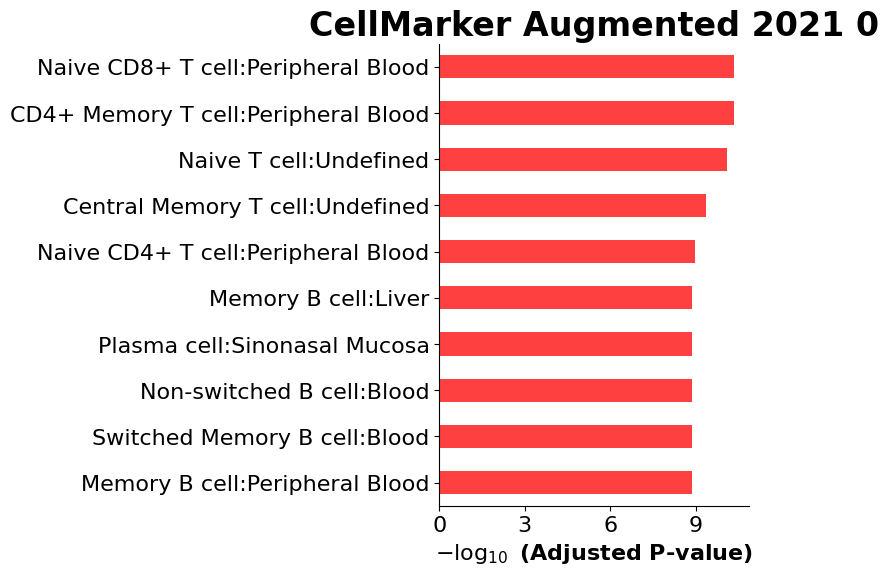

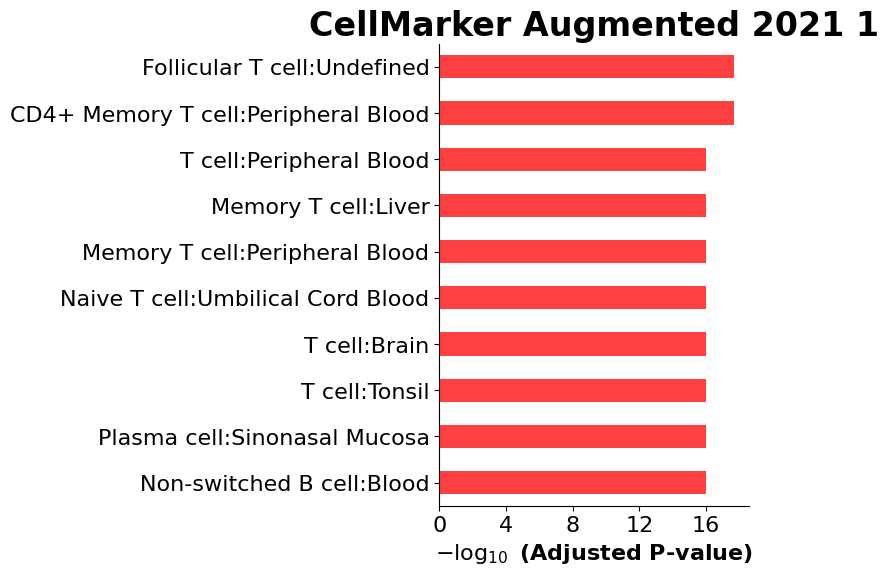

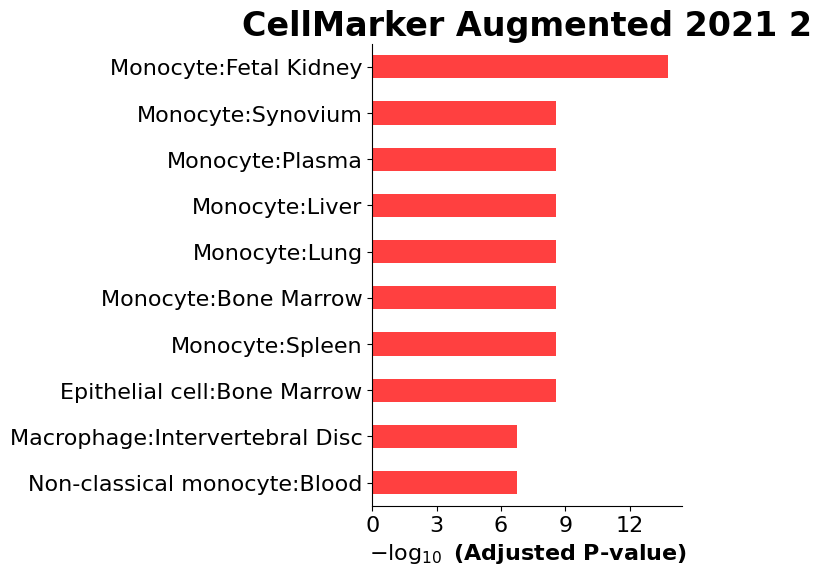

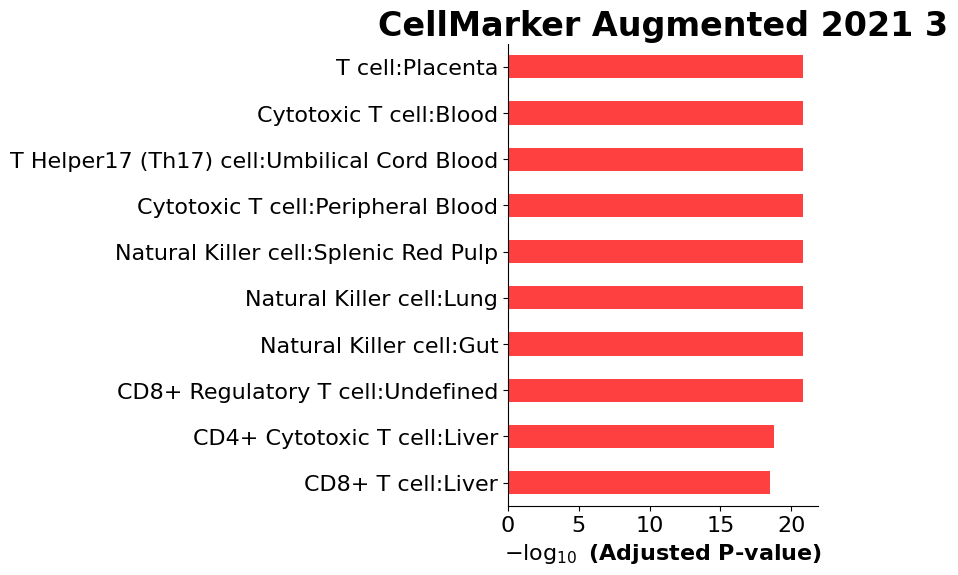

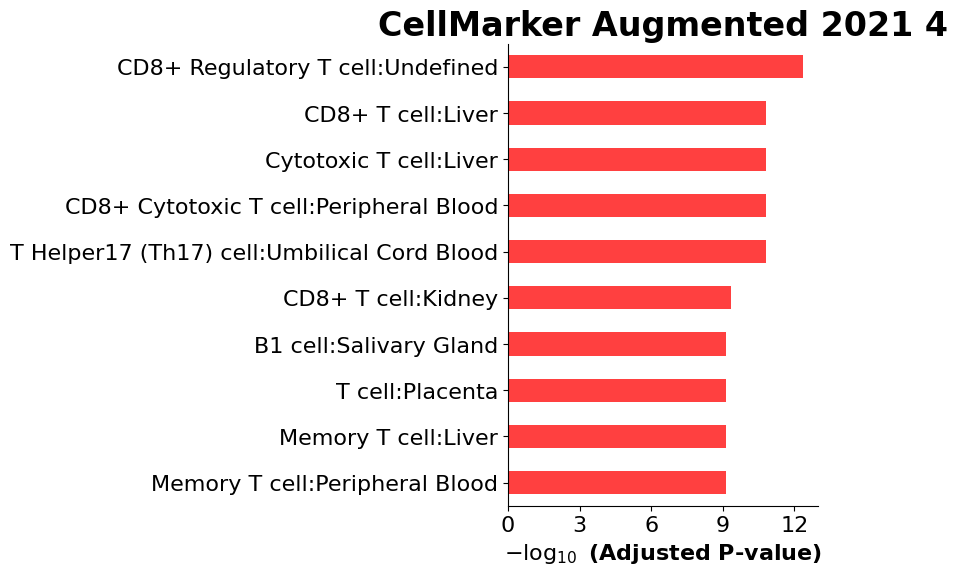

...

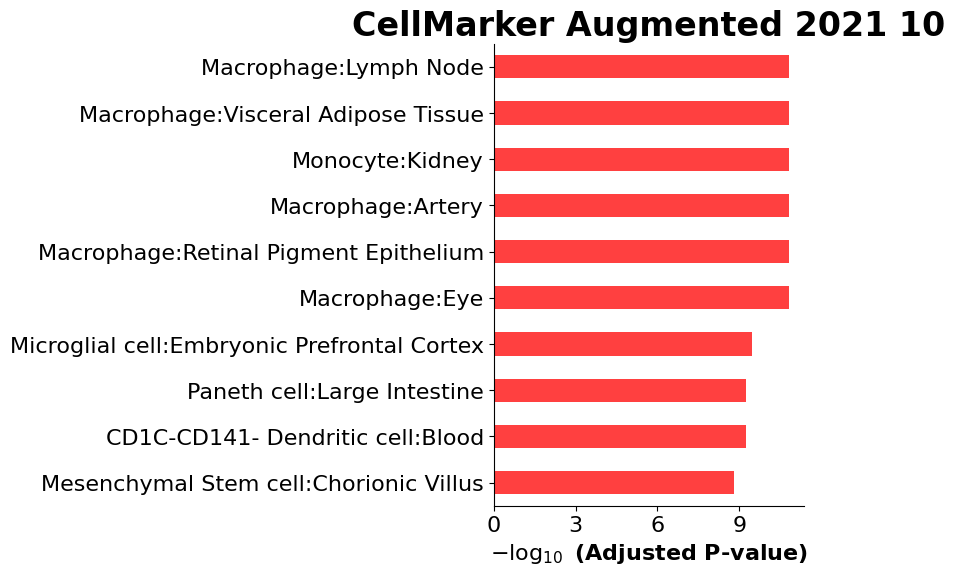

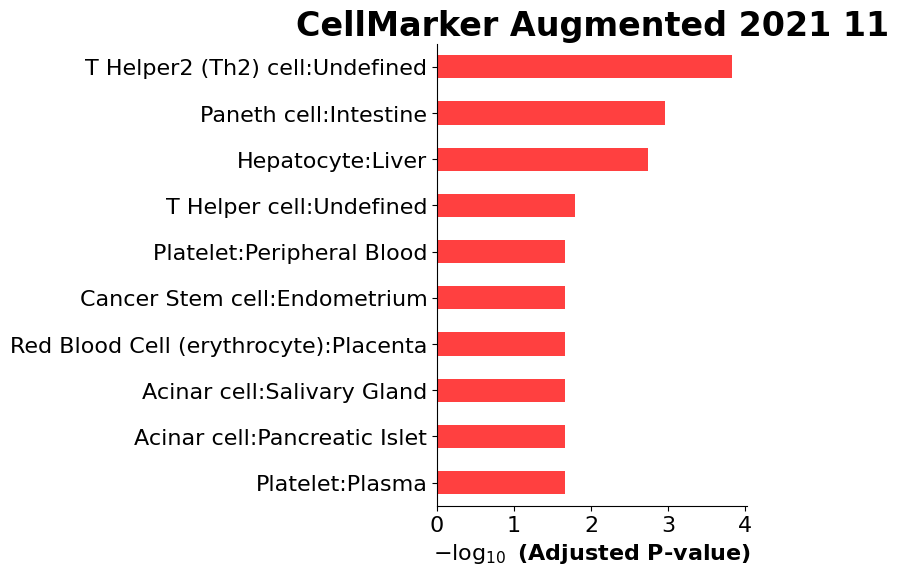

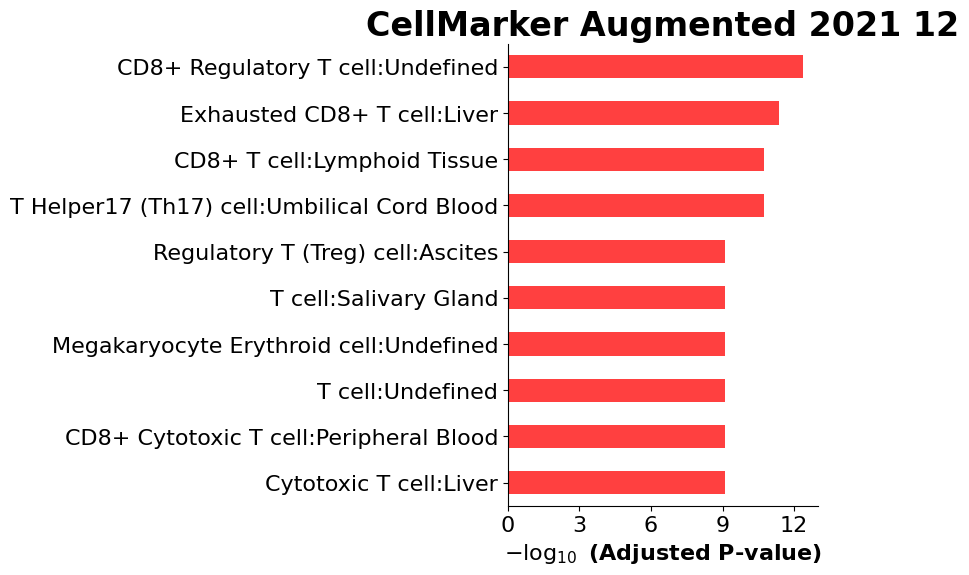

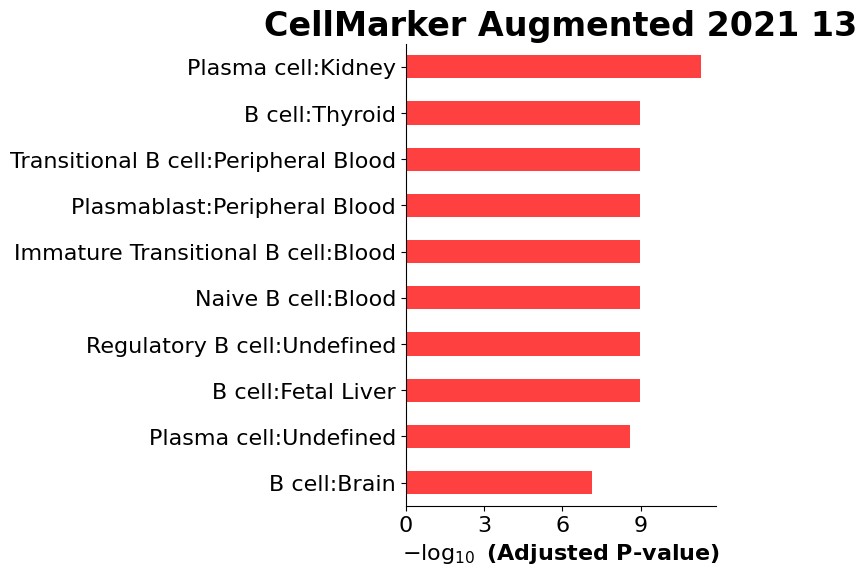

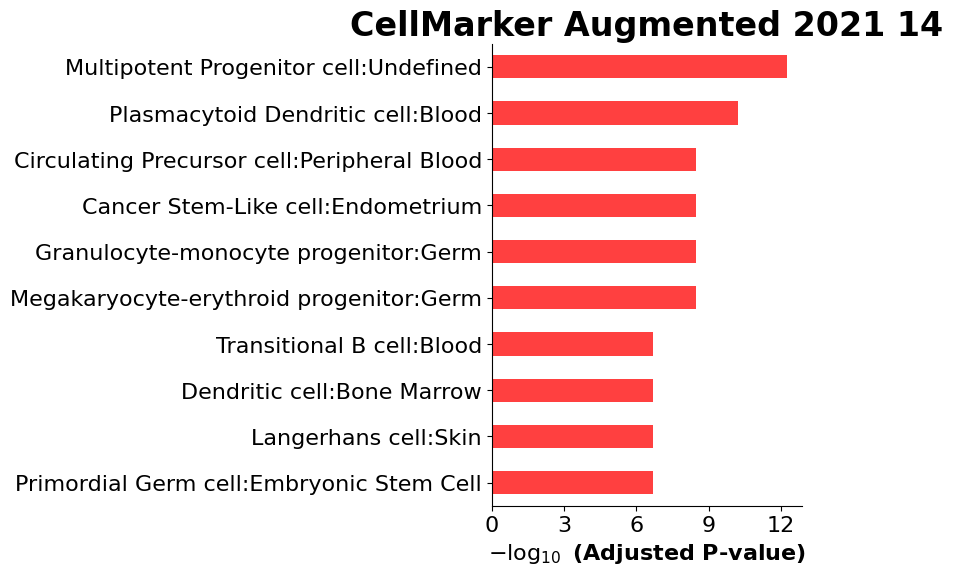

In [70]:
from gseapy.plot import barplot, dotplot
i = 0
for res in gsea_res.values():
    barplot(res.res2d,title='CellMarker Augmented 2021 {}'.format(i),color = 'r')
    i=i+1

#### markers from pavel

In [71]:
nix = ['CD3D', 'CD4', 'LEF1', 'PIK3IP1',
      'CCR7', 'S100A9', 'FCN1', 'CD14',
      'CD8B', 'CD8A', 'IGHM_membrane', 'IGKC',
      'IGLC3', 'FCGR3A', 'FCER1G', 'IFITM3',
      'ALAS2', 'SNCA', 'SLC25A37', 'CCL5',
      'NKG7', 'TRDC', 'GNLY', 'IL32',
      'KLRB1', 'RGS1', 'GZMH', 'CCL4',
      'FOXP3', 'CTLA4']

In [72]:
# this code is to get deg's from each cluster
nitx = []
for cluster in clusters:
    sublist = merge_df[merge_df['Cluster'] == cluster]
    items = list(sublist.Gene)
    nitx.append(items)
nnix =  [val for sublist in nitx for val in sublist]



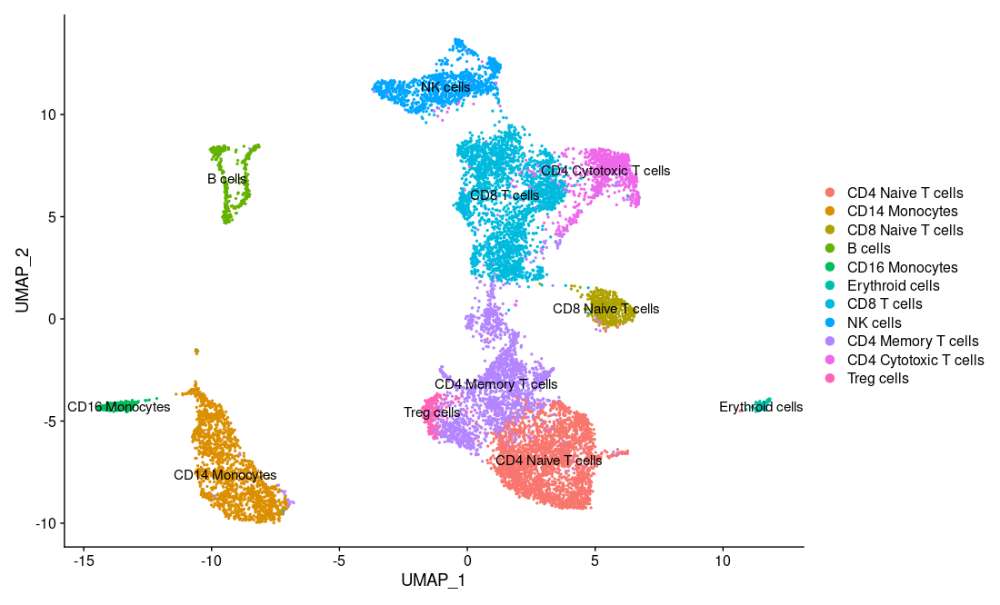

In [73]:
    import base64, io, IPython
    from PIL import Image as PILImage
    image_path = 'umap.png'

    image = PILImage.open(image_path)

    output = io.BytesIO()
    image.save(output, format='PNG')
    encoded_string = base64.b64encode(output.getvalue()).decode()

    html = '<img src="data:image/png;base64,{}"/>'.format(encoded_string)
    IPython.display.HTML(html)


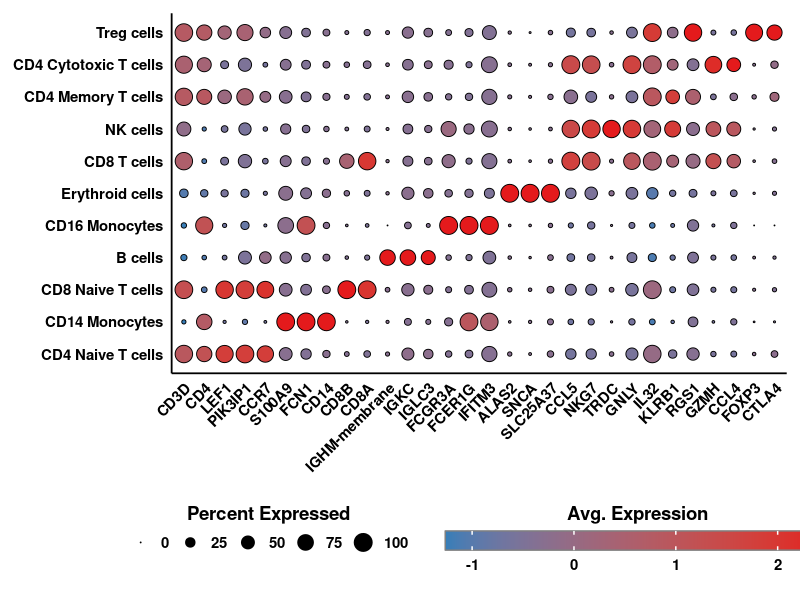

In [74]:

    image_path = 'Markers.png'

    image = PILImage.open(image_path)

    output = io.BytesIO()
    image.save(output, format='PNG')
    encoded_string = base64.b64encode(output.getvalue()).decode()

    html = '<img src="data:image/png;base64,{}"/>'.format(encoded_string)
    IPython.display.HTML(html)

/home/mrinalmanu/miniconda3/envs/scrna/lib/python3.8/site-packages/scanpy/plotting/_dotplot.py:749: UserWarning:

No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored



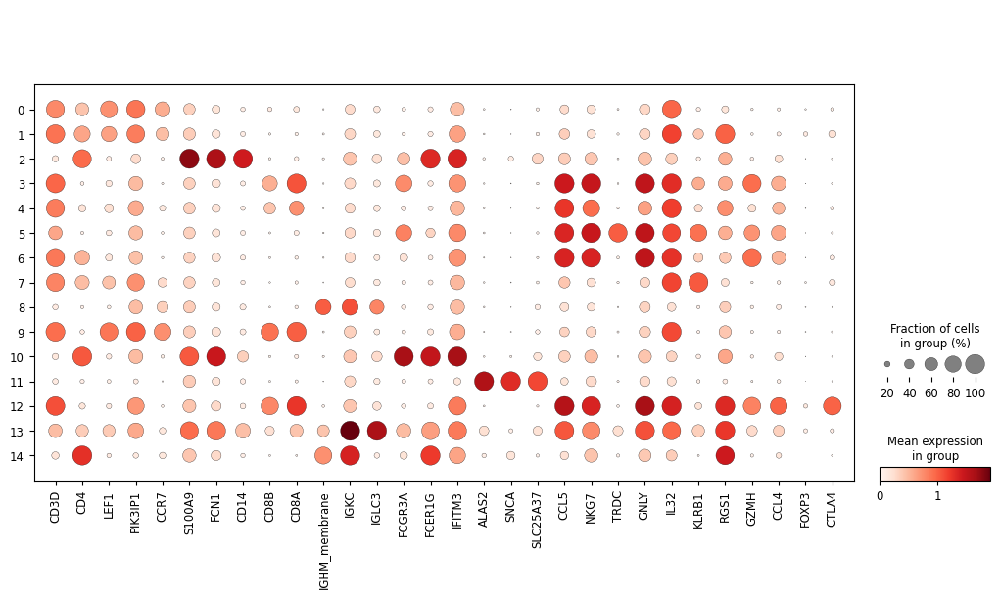

In [75]:
sc.pl.dotplot(adata, nix, groupby='louvain_r1')

/home/mrinalmanu/miniconda3/envs/scrna/lib/python3.8/site-packages/scanpy/plotting/_dotplot.py:749: UserWarning:

No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored



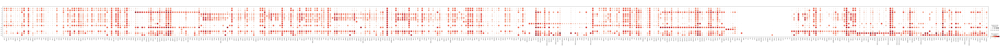

In [76]:
sc.pl.dotplot(adata, nnix, groupby='louvain_r1')

In [77]:
# combined annotation from unique and non unique + Automatic annotation
new_cluster_names1 = {0: '0 Naive CD4 T cell',                    
 1: '1 CD14+ Monocytes',
 2: '2 CD8 T cells',                      
 3: '3 Naive CD4 T cell',                       
 4: '4 CD4 Memory T cell',                                  
 5: '5 CD8 T cells',             
 6: '6 NK cells',                      
 7: '7 CD4 Cytotoxic T cell',
 8: '8 B cell',
 9: '9 CD16 Monocytes',
 10: '10 Erythroid-like',                      
 11: '11 Exhausted CD8+ T cell',                      
 12: '12 Plasmatoid dendritic',
 13: '13 Basophils'
}


2 and 5 can be merged, 0 and 3 can be merged

In [78]:
adata.obs['louvain_r1'] = adata.obs['louvain_r1'].astype('category')
adata.obs['r1_cell'] = adata.obs['louvain_r1']

In [79]:
adata.rename_categories('r1_cell', list(new_cluster_names1.values()))

/home/mrinalmanu/miniconda3/envs/scrna/lib/python3.8/site-packages/anndata/_core/anndata.py:1160: FutureWarning:

The `inplace` parameter in pandas.Categorical.rename_categories is deprecated and will be removed in a future version. Removing unused categories will always return a new Categorical object.



ValueError: new categories need to have the same number of items as the old categories!

In [80]:
## interactive plot

adata.obs = adata.obs.astype('category')
graphdata = import_adata(adata, use_raw=False, make_var_unique=True)
axiscolor = '#000000'


predictors = adata.obs.columns.tolist()

@interact
def read_values(
    predictor=widgets.Dropdown(
        description="Color by:", value='louvain_r1', options=predictors
    )
):

    one = update_figure_scatter(splitbyvalue = predictor,
    colorvalue =  "categorical data",
    Xaxis = 'X_umap_1',
    Yaxis = 'X_umap_2',
    opacity =50,
    pointsize = 5.0,
    axiswitchvalue = "ON",
                                cmin_input="",
                                cmax_input="")
    
    
    fig1 = go.Figure(one
            )
    
    go.FigureWidget(fig1.to_dict()).show()


/tmp/ipykernel_11564/4122076929.py:46: DeprecationWarning:

Please use `csr_matrix` from the `scipy.sparse` namespace, the `scipy.sparse.csr` namespace is deprecated.



interactive(children=(Dropdown(description='Color by:', index=7, options=('Cell_Index', 'Sample_Tag', 'Sample_…

## merging clusters together 

In [ ]:
adata.obs['louvain_r1'][adata.obs['louvain_r1']=='3']='0'
adata.obs['louvain_r1'][adata.obs['louvain_r1']=='5']='2'

adata.obs['louvain_r1']=adata.obs['louvain_r1'].astype('str').astype('category')
### Reorder and rename the louvain_r1
adata.obs['louvain_r1'].cat.rename_categories(np.arange(len(np.unique(adata.obs['louvain_r1']))).astype('str'), inplace=True)

In [ ]:
## interactive plot

adata.obs = adata.obs.astype('category')
graphdata = import_adata(adata, use_raw=False, make_var_unique=True)
axiscolor = '#000000'


predictors = adata.obs.columns.tolist()

@interact
def read_values(
    predictor=widgets.Dropdown(
        description="Color by:", value='louvain_r1', options=predictors
    )
):

    one = update_figure_scatter(splitbyvalue = predictor,
    colorvalue =  "categorical data",
    Xaxis = 'X_umap_1',
    Yaxis = 'X_umap_2',
    opacity =50,
    pointsize = 5.0,
    axiswitchvalue = "ON",
                                cmin_input="",
                                cmax_input="")
    
    
    fig1 = go.Figure(one
            )
    
    go.FigureWidget(fig1.to_dict()).show()


In [ ]:
# combined annotation from unique and non unique + Automatic annotation
new_cluster_names1 = {0: 'Naive CD4 T cells',                    
 1: 'CD14+ Monocytes',
 2: 'Erythroid-like',
 3: 'Exhausted CD8+ T cells',  
 4: 'Plasmatoid dendritic',                 
 5: 'Basophils',    
 6: 'CD8 T cells',  
 7: 'CD4 Memory T cells',
 8: 'NK Cells',
 9: 'CD4 Cytotoxic T cells',
 10: 'B cells',     
 11: 'CD16 Monocytes'
}


adata.obs['louvain_r1'] = adata.obs['louvain_r1'].astype('category')
adata.obs['r1_cell'] = adata.obs['louvain_r1']

adata.rename_categories('r1_cell', list(new_cluster_names1.values()))

In [ ]:
## interactive plot

adata.obs = adata.obs.astype('category')
graphdata = import_adata(adata, use_raw=False, make_var_unique=True)
axiscolor = '#000000'


predictors = adata.obs.columns.tolist()

@interact
def read_values(
    predictor=widgets.Dropdown(
        description="Color by:", value='louvain_r1', options=predictors
    )
):

    one = update_figure_scatter(splitbyvalue = predictor,
    colorvalue =  "categorical data",
    Xaxis = 'X_umap_1',
    Yaxis = 'X_umap_2',
    opacity =50,
    pointsize = 5.0,
    axiswitchvalue = "ON",
                                cmin_input="",
                                cmax_input="")
    
    
    fig1 = go.Figure(one
            )
    
    go.FigureWidget(fig1.to_dict()).show()


In [ ]:
sc.pl.umap(adata, color='louvain_r1', legend_loc='on data')


In [ ]:
sc.pl.umap(adata, color='r1_cell', legend_loc='on data')


In [ ]:
#draw graph

sc.tl.draw_graph(adata)
sc.tl.diffmap(adata)

sc.pp.neighbors(adata, n_neighbors=15, use_rep='X_diffmap')
sc.tl.draw_graph(adata)
sc.pl.draw_graph(adata, color='louvain_r1', legend_loc='on data')



In [ ]:
sc.tl.paga(adata, groups='louvain_r1')

sc.pl.paga(adata, color=['louvain_r1'], title=['Cell type'])

sc.pl.draw_graph(adata, color=['Sample_Name'], title=['Samples'])


# plots

In [ ]:
for i in list(adata.obs['Sample_Name'].unique()):
    sc.pl.umap(adata[adata.obs['Sample_Name']==i], color='r1_cell', title=i, use_raw=False, color_map='inferno', wspace=0.5)

In [ ]:
##PLOT UMAP EMBEDDING DENSITY FOR EACH GROUP:
adata.obs['condition']=adata.obs['Sample_Name'].astype('category')

sc.tl.embedding_density(adata, basis='umap', groupby='condition', key_added='umap_density')


for i in list(adata.obs['Sample_Name'].unique()):
    sc.pl.embedding_density(adata, group=i, basis='umap', key='umap_density', color_map='inferno', title=i)

In [ ]:
from matplotlib.pyplot import rc_context
sc.set_figure_params(dpi=100, color_map = 'viridis_r')
sc.settings.verbosity = 1
sc.logging.print_header()

In [ ]:


with rc_context({'figure.figsize': (4,4)}):
    sc.pl.umap(adata, color=['Sample_Name', 'Sample_Groups', 'louvain_r0.5', 'r1_cell'], s=50, frameon=False, ncols=4, vmax='p99')


In [ ]:
with rc_context({'figure.figsize': (4,4)}):
    sc.pl.umap(adata, color=['CD3D', 'CD4', 'LEF1', 'PIK3IP1',
      'CCR7', 'S100A9', 'FCN1', 'CD14',
      'CD8B', 'CD8A', 'IGHM_membrane', 'IGKC',
      'IGLC3', 'FCGR3A', 'FCER1G', 'IFITM3',
      'ALAS2', 'SNCA', 'SLC25A37', 'CCL5',
      'NKG7', 'TRDC', 'GNLY', 'IL32',
      'KLRB1', 'RGS1', 'GZMH', 'CCL4',
      'FOXP3', 'CTLA4'], s=50, frameon=False, ncols=4, vmax='p99')


In [ ]:
# all degs and unique genes

with rc_context({'figure.figsize': (4,4)}):
    sc.pl.umap(adata, color=merge_df.Gene.unique(), s=50, frameon=False, ncols=4, vmax='p99')


In [ ]:
# rank gene groups

sc.tl.rank_genes_groups(adata, groupby='r1_cell', method='wilcoxon', key_added = "wilcoxon")
sc.pl.rank_genes_groups(adata, n_genes=25, sharey=False,  key = "wilcoxon")
# dendrogram computed seperately
sc.tl.dendrogram(adata, groupby="r1_cell")

In [ ]:
result = adata.uns['wilcoxon']
groups = result['names'].dtype.names
xdf = pd.DataFrame(
    {group + '_' + key[:1]: result[key][group]
    for group in groups for key in ['names', 'scores']}).head(5)
xdf

define_head=20

markdf = pd.DataFrame(
    {group: result[key][group]
    for group in groups for key in ['names']}).head(define_head)
valuedf = pd.DataFrame(
      {group: result[key][group]
    for group in groups for key in ['scores']}).head(define_head)
markdf = markdf.melt()
valuedf = valuedf.melt()


mergedf = pd.merge(markdf, valuedf, left_index=True, right_index=True)

mergedf.drop('variable_y', axis=1, inplace=True)
mergedf.columns = ['Cluster','Gene','Score']
mergedf


In [ ]:
df = mergedf.pivot(index='Cluster', columns='Gene', values='Score')
df = df.fillna(0)

fig = dash_bio.Clustergram(
    data=df.iloc[:, : len(mergedf.Gene.unique())],
    column_labels=list(df.columns.values),
    row_labels=list(df.index),
    height=720,
    width=2500
)
fig.write_html('dendro_with_annotation.html')
fig.show()


In [ ]:
fig = px.imshow(df, text_auto=False)

fig.update_yaxes(autorange="reversed")

fig.update_layout(yaxis={"dtick":1},margin={"t":0,"b":0},height=1000)
fig.update_layout(xaxis={"dtick":1},margin={"t":0,"b":0},width=2200)

fig.show()

In [ ]:
# row normalised heatmap

rdf = df.div(df.sum(axis=1), axis=0)

fig = px.imshow(rdf, text_auto=False)

fig.update_yaxes(autorange="reversed")

fig.update_layout(yaxis={"dtick":1},margin={"t":0,"b":0},height=1000)
fig.update_layout(xaxis={"dtick":1},margin={"t":0,"b":0},width=2200)

fig.show()

In [ ]:

fig = px.scatter(mergedf, x="Gene", color='Cluster', y='Score')
fig.update_layout(yaxis={"dtick":5},margin={"t":0,"b":0},height=800)
fig.update_layout(xaxis={"dtick":1},margin={"t":0,"b":0},width=2200)

fig.show()

In [ ]:
adata.write(results_file)

# comparision sample groups

In [ ]:
adata = sc.read(results_file)


import scipy.stats
import batchglm.api as glm
import diffxpy.api as de

print("batchglm version "+glm.__version__)
print("diffpy version "+de.__version__)

In [ ]:

counts = pd.DataFrame(adata.obs)
counts['c'] = 1
counts = counts.groupby(['Sample_Name', 'r1_cell'])['c'].sum().reset_index()
ncx = counts.groupby(['Sample_Name'])['c'].sum().reset_index()
gcx = pd.merge(ncx, counts, on='Sample_Name')
gcx['prop'] = gcx['c_y']/gcx['c_x']
counts = gcx

counts.columns = ['Sample Name', 'total', 'Grouping', 'raw counts','Proportion']
counts['Grouping'] = counts['Grouping'].map(str)
fig = px.bar(counts, x="Sample Name", y="Proportion", color="Grouping", title="Proportions across Groupings")
fig.update_layout(xaxis={'categoryorder':'total descending'})
fig.show()

In [ ]:

counts = pd.DataFrame(adata.obs)
counts['c'] = 1
counts = counts.groupby(['Sample_Name', 'r1_cell'])['c'].sum().reset_index()
ncx = counts.groupby(['r1_cell'])['c'].sum().reset_index()
gcx = pd.merge(ncx, counts, on='r1_cell')
gcx['prop'] = gcx['c_y']/gcx['c_x']
counts = gcx
counts.columns = ['Sample Name', 'total', 'Grouping', 'raw counts','Proportion']
counts['Grouping'] = counts['Grouping'].map(str)
fig = px.bar(counts, x="Sample Name", y="Proportion", color="Grouping", title="Proportions across Groupings")
fig.update_layout(xaxis={'categoryorder':'total descending'})
#fig.show()

In [ ]:
import itertools
pairs = []
for pair in itertools.combinations(adata.obs['Sample_Name'].unique(),2):
    pairs.append(pair)
                 
pairs

counts = []
for pair in pairs:
    counts.append([pair, len(adata.obs[adata.obs['Sample_Name'].isin(pair)])])
    
counts = pd.DataFrame(counts)

counts.columns = ['Grouping', 'Counts']
counts['Grouping'] = counts['Grouping'].map(str)
fig = px.bar(counts, x="Grouping", y="Counts", color="Counts", title="Counts across Groupings")
fig.update_layout(xaxis={'categoryorder':'total descending'})
fig.show()

In [ ]:
l1 = list(adata.obs['Sample_Name'].unique())
l2 = list(adata.obs['louvain_r1'].unique())
comb = list(itertools.product(l1, l2))

pairs = []
for pair in itertools.combinations(comb,2):
    pairs.append(pair)

counts1 = []
counts2 = []
counts3 = []
counts4 = []

for pair in pairs:
    counts1.append([pair[0][0], len(adata.obs[adata.obs['Sample_Name']==pair[0][0]])])
    counts2.append([pair[0][1], len(adata.obs[adata.obs['louvain_r1']==pair[0][1]])])
    counts3.append([pair[1][0], len(adata.obs[adata.obs['Sample_Name']==pair[1][0]])])
    counts4.append([pair[1][1], len(adata.obs[adata.obs['louvain_r1']==pair[1][1]])])
    
cdf1 = pd.DataFrame(counts1)
cdf2 = pd.DataFrame(counts2)
cdf3 = pd.DataFrame(counts3)
cdf4 = pd.DataFrame(counts4)
cdfx = pd.concat([cdf1, cdf2, cdf3, cdf4], axis=1) 
cdfx.columns = ['g10', 'c10', 'g11', 'c11', 'g20', 'c20', 'g21', 'c22']

cdfx['g10g11'] = cdfx['g10']+' '+cdfx['g11']
cdfx['c10c11'] = cdfx['c10']+cdfx['c11']
cdfx['g20g21'] = cdfx['g20']+' '+cdfx['g21']
cdfx['c20c21'] = cdfx['c20']+cdfx['c22']
cdfx['dc'] = 1


ndfx = cdfx[['g10g11', 
             'c10c11']]
ndfx = ndfx.drop_duplicates(subset='g10g11')


fig = px.bar(ndfx, x="g10g11", y="c10c11", color="c10c11", title="Counts across Groupings with Clusters")
fig.update_layout(xaxis={'categoryorder':'total descending'})
fig.show()

In [ ]:
# first breaking the anndata down by clusters

pairs = list(adata.obs['r1_cell'].unique())
# subsetting the dataset for each grouping
madata = []
for pair in pairs:
    adatax = sc.AnnData(data[data.index.isin(adata.obs[adata.obs['r1_cell'] == pair]['Cell_Index'])])
    adatax.obs = adata.obs[adata.obs['r1_cell'] == pair]
    madata.append(adatax)
    



In [ ]:
madata

In [ ]:
gx = adata.obs.groupby('Sample_Name')['Cell_Index'].count().reset_index()
gx = gx[gx['Cell_Index']>5]
gx

In [ ]:
sample_size = 5 # change minimum sample size here

In [ ]:
# Now creating comparison for each cluster for each sample grouping and then testing!


# rank gene groups

# Warning! maybe computationally intensive depending upon total comparisons
df0 = pd.DataFrame()

for adata in madata:
    #adata.uns['log1p']["base"] = None
    gx = adata.obs.groupby('Sample_Name')['Cell_Index'].count().reset_index()
    gx = gx[gx['Cell_Index']>sample_size]

    pairs = []
    print(gx)
    
    for pair in itertools.combinations(gx['Sample_Name'].unique(),2):
        pairs.append(pair)
        print('Compared pair: {} in Cluster: {}'.format(pair, list(adata.obs.r1_cell.unique())))
        

    for pair in pairs:
        adatax = sc.AnnData(data[data.index.isin(adata.obs[adata.obs['Sample_Name'].isin(pair)]['Cell_Index'])])
        adatax.obs = adata.obs[adata.obs['Sample_Name'].isin(pair)]

        test = de.test.t_test(
            data=adatax,
            grouping="Sample_Name"
                            )
        df1 = pd.DataFrame(pd.DataFrame(test.summary()))
        df1['comparison'] = ''
        df1['comparison'] = str(list(adatax.obs.r1_cell.astype('category').unique())) +' : ' +str(list(adatax.obs.Sample_Name.astype('category').unique()))
        df0 = pd.concat([df0, df1], axis=0)


In [ ]:

pd.options.display.float_format = '{:.6f}'.format
dfn = df0
#dfn['lnx'] = np.log10(dfn['log2fc'].abs())
#dfn['lnx'] = dfn['lnx']*(np.sign(dfn["log2fc"]))

dfn[['cluster', 'TP']] = dfn['comparison'].str.split(':', 1, expand=True)
dfn['TP_s'] = dfn['TP'].str.replace('\d+', '')

#dfn['TP_s'] = dfn['TP_s'].str.replace("['Tissue', 'PBMC']", "['PBMC', 'Tissue']")
dfn

In [ ]:
fig = px.histogram(dfn, x="qval")
fig.show()

In [ ]:
fig = px.histogram(dfn, x="log2fc")
fig.show()

In [ ]:
dfn = df0[df0['qval'] <= 0.05]
dfn['log2qval'] = np.log10(dfn['qval'])
dfn = dfn[dfn['log2fc'].between(-20, 20)]

In [ ]:
fig = px.scatter(dfn, x='log2fc', y="log2qval", color='TP_s', hover_data = ['gene', 'qval', 'comparison'])
fig.show()

In [ ]:

#dfn = dfn[~dfn['lnx'].between(-0.5, 0.5)]
#dfn = dfn[dfn['mean'] > 5]
#dfn = dfn[dfn['qval'] < 0.05]
dfn
# use xl export lib

In [ ]:
s = dfn.groupby('TP')

for name, group in s:
    group.to_excel(f"{name}.xls")

In [ ]:
fig = px.scatter(dfn, x='log2fc', y="qval", color='TP_s', hover_data = ['gene', 'qval', 'comparison'])
fig.show()

#plot by pvalue for y axis

In [ ]:
df = dfn.pivot(index='comparison', columns='gene', values='log2fc')
df = df.fillna(0)

In [ ]:
color_palette = [
    'rgb(84,48,5)',
    'rgb(246,232,195)',
    'rgb(0,60,48)'
]

fig_opts = dict(
    cluster='all',
    display_ratio=[0.3, 0.1],    
    color_threshold=dict(row=9, col=35),
    color_map=[
        [0.0, color_palette[0]],
        [0.5, color_palette[1]],
        [1.0, color_palette[2]]
    ],
    color_list={
        'row': [color_palette[0], color_palette[1], color_palette[2]],
        'col': [color_palette[1], color_palette[2], color_palette[0]],
        'bg': 'rgb(255,255,255)'
    },
    annotation_font=dict(
        color='black',
        size=10
    ),
    tick_font=dict(
        size=7,
        color='rgb(200,200,200)'
    ),
    optimal_leaf_order=True,
    center_values=False,
    log_transform=False,
    
)

fig = dash_bio.Clustergram(
    data=df.iloc[:, : len(merge_df.Gene.unique())],
    column_labels=list(df.columns.values),
    row_labels=list(df.index),
    height=1000,
    width=2500,
    **fig_opts
)
fig.show()

In [ ]:
fig = px.imshow(df.iloc[:, : len(dfn.gene.unique())], text_auto=False, aspect="auto")

fig.update_xaxes(
        tickangle = 45,
        title_text = "gene",
        title_font = {"size": 12},
        title_standoff = 25,
tickmode='linear')

fig.update_yaxes(
        title_text = "lnx",
        title_standoff = 50,
tickmode='linear')

fig.update_layout(
    title="Genes shared among clusters (N={})".format(len(merge_df.Gene.unique())),
    legend_title="Options",
    font=dict(
        family="Ariel, ariel",
        size=10,
        color="RebeccaPurple"
        
    ),
barmode="stack",
    
)
fig.update_yaxes(autorange="reversed")

fig.update_layout(yaxis={"dtick":1},margin={"t":0,"b":0},height=800)
fig.update_layout(xaxis={"dtick":1},margin={"t":0,"b":0},width=2200)

fig.show()

In [ ]:
df = df.div(df.sum(axis=1), axis=0)

In [ ]:
fig = px.imshow(df.iloc[:, : len(dfn.gene.unique())], text_auto=False, aspect="auto")

fig.update_xaxes(
        tickangle = 45,
        title_text = "gene",
        title_font = {"size": 12},
        title_standoff = 25,
tickmode='linear')

fig.update_yaxes(
        title_text = "lnx",
        title_standoff = 50,
tickmode='linear')

fig.update_layout(
    title="Genes shared among clusters (N={})".format(len(merge_df.Gene.unique())),
    legend_title="Options",
    font=dict(
        family="Ariel, ariel",
        size=10,
        color="RebeccaPurple"
        
    ),
barmode="stack",
    
)
fig.update_yaxes(autorange="reversed")

fig.update_layout(yaxis={"dtick":1},margin={"t":0,"b":0},height=800)
fig.update_layout(xaxis={"dtick":1},margin={"t":0,"b":0},width=2200)

fig.show()

In [ ]:
df = dfn.pivot(index='comparison', columns='gene', values='mean')
#df = df.fillna(0)
df = df.div(df.sum(axis=1), axis=0)


In [ ]:
fig = px.imshow(df.iloc[:, : len(dfn.gene.unique())], text_auto=False, aspect="auto")

fig.update_xaxes(
        tickangle = 45,
        title_text = "gene",
        title_font = {"size": 12},
        title_standoff = 25,
tickmode='linear')

fig.update_yaxes(
        title_text = "lnx",
        title_standoff = 50,
tickmode='linear')

fig.update_layout(
    title="Genes shared among clusters (N={})".format(len(merge_df.Gene.unique())),
    legend_title="Options",
    font=dict(
        family="Ariel, ariel",
        size=10,
        color="RebeccaPurple"
        
    ),
barmode="stack",
    
)
fig.update_yaxes(autorange="reversed")

fig.update_layout(yaxis={"dtick":1},margin={"t":0,"b":0},height=800)
fig.update_layout(xaxis={"dtick":1},margin={"t":0,"b":0},width=2200)

fig.show()

In [ ]:
adata = sc.read(results_file)

print("batchglm version "+glm.__version__)
print("diffpy version "+de.__version__)

adata

l1 = list(adata.obs['Sample_Name'].unique())
l2 = list(adata.obs['louvain_r1'].unique())
comb = list(itertools.product(l1, l2))
comb

import itertools
pairs = []
for pair in itertools.combinations(comb,2):
    pairs.append(pair)


counts1 = []
counts2 = []
counts3 = []
counts4 = []

for pair in pairs:
    counts1.append([pair[0][0], len(adata.obs[adata.obs['Sample_Name']==pair[0][0]])])
    counts2.append([pair[0][1], len(adata.obs[adata.obs['louvain_r1']==pair[0][1]])])
    counts3.append([pair[1][0], len(adata.obs[adata.obs['Sample_Name']==pair[1][0]])])
    counts4.append([pair[1][1], len(adata.obs[adata.obs['louvain_r1']==pair[1][1]])])

cdf1 = pd.DataFrame(counts1)
cdf2 = pd.DataFrame(counts2)
cdf3 = pd.DataFrame(counts3)
cdf4 = pd.DataFrame(counts4)
cdfx = pd.concat([cdf1, cdf2, cdf3, cdf4], axis=1) 
cdfx.columns = ['g10', 'c10', 'g11', 'c11', 'g20', 'c20', 'g21', 'c22']
cdfx

cdfx['g10g11'] = cdfx['g10']+' '+cdfx['g11']
cdfx['c10c11'] = cdfx['c10']+cdfx['c11']
cdfx['g20g21'] = cdfx['g20']+' '+cdfx['g21']
cdfx['c20c21'] = cdfx['c20']+cdfx['c22']
cdfx['dc'] = 1
cdfx

ndfx = cdfx[['g10g11', 
             'c10c11']]
ndfx = ndfx.drop_duplicates(subset='g10g11')

fig = px.bar(ndfx, x="g10g11", y="c10c11", color="c10c11", title="Counts across Groupings 1")
fig.update_layout(xaxis={'categoryorder':'total descending'})
fig.show()

EON